In [2]:
# GAT with complex and normalisation

import torch
import torch_geometric
print('torch version:',torch.__version__)
print('torch version.cuda:',torch.version.cuda)
print('torch geometric version:',torch_geometric.__version__)

torch version: 2.2.1+cu121
torch version.cuda: 12.1
torch geometric version: 2.6.1


In [3]:
from sparticles_hadhad.rewritten_dataset import EventsDataset
from sparticles_hadhad.rewritten_dataset import DEFAULT_EVENT_SUBSETS
from sparticles_hadhad.rewritten_dataset import EVENT_TABLE
import matplotlib.pyplot as plt
from sparticles_hadhad.transforms import MakeHomogeneous
make_homogeneous_trans = MakeHomogeneous()
from sparticles import plot_event_2d
import os
import errno
import numpy as np
from numpy import pi

In [4]:
#Code block for processing the raw data from the h5 file. These are the h5 files that cut events with pT < 20GeV.
sig_no = 233994 #max = 233994
ttb_no = 56377 #max = 56377
vjets_no = 0

if sig_no == ttb_no:
    stats_string = 'balanced_stats'
else:
    stats_string = f'sig_{sig_no}_ttb_{ttb_no}'
    
processed_file = f"/hepstore/{os.environ['USER']}/fcc_hh_data_hadhad/processed/events_signal_{sig_no}_ttbar_{ttb_no}_vjets_{vjets_no}.pt"

def remove_processed(filename):
    try:
        os.remove(filename)
    except OSError as e: 
        if e.errno != errno.ENOENT: 
            raise

#remove_processed(processed_file)

graphs = EventsDataset(
    root= f'/hepstore/{os.environ["USER"]}/fcc_hh_data_hadhad',
    url='https://cernbox.cern.ch/s/SpsIy2kRzVZtwnn/download/',
    delete_raw_archive=False,
    add_edge_index=True,
    event_subsets={'signal': sig_no, 'ttbar': ttb_no, 'vjets': vjets_no}, #For the FCC, only ttbar events are used, but the h5 file for background is saved and taken from the 'singletop' file. 
    transform=MakeHomogeneous(),
    download_type=2,
    signal_filename='hhbbtata.h5', # Specify the signal filename here
    bb_features = {"m_bb": True, "dEta_bb": False, "dPhi_bb": False, "dR_bb": True},
    tt_features = {"m_tt": True, "dEta_tt": False, "dPhi_tt": False, "dR_tt": True, "dpT_tt": True},
    other_features = {"m_T": True, "C_met": True, "m_HH": True, "dPhi_HH": True},
)
  
save_bool = graphs.feature_string()

In [4]:
print(graphs[0].data_norm)

tensor([[ 0.3291,  0.0000,  0.7313,  0.0000,  1.6086,  0.0000,  0.0000,  1.0000,
          0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,
          0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000],
        [-0.5207,  0.0000,  0.1790,  0.0000,  1.3237,  0.0000,  0.0000,  1.0000,
          0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,
          0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000],
        [ 1.5956,  0.0000,  0.7789,  0.0000, -0.2712,  0.0000,  0.0000,  1.0000,
          0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,
          0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000],
        [-0.5804,  0.0000,  1.0205,  0.0000, -0.8397,  0.0000,  0.0000,  1.0000,
          0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,
          0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000],
        [-0.3298,  0.000

In [5]:
# using GATv2Conv
from torch_geometric.nn import GATv2Conv, global_mean_pool
import torch

MANUAL_SEED = 1234 

class GAT(torch.nn.Module):
    def __init__(self, input_channels, hidden_channels, num_classes):
        super(GAT, self).__init__()
        torch.manual_seed(MANUAL_SEED)
        self.conv1 = GATv2Conv(input_channels, hidden_channels)
        self.activation1 = torch.nn.ReLU() 
        self.conv2 = GATv2Conv(hidden_channels, hidden_channels)
        self.activation2 = torch.nn.ReLU() 
        self.conv3 = GATv2Conv(hidden_channels, hidden_channels)
        self.aggregate = global_mean_pool
        self.head = torch.nn.Linear(hidden_channels, num_classes)


    def forward(self, x, edge_index, batch):
        x = self.conv1(x, edge_index)
        x = self.activation1(x)
        x = self.conv2(x, edge_index)
        x = self.activation2(x)
        x = self.conv3(x, edge_index)
        x = self.aggregate(x, batch)
        x = self.head(x)
        return x

In [7]:
from torch.utils.data import Subset
from torch_geometric.loader import DataLoader
from sklearn.model_selection import train_test_split
import time

# 3 fold 
# fold |  A        | B        | C
#  1   |  Train    | Validate | Test 
#  2   |  Test     | Train    | Validate
#  3   |  Validate | Test     | Train

all_graphs = graphs

setA_graphs = all_graphs[0::3] # for training
setB_graphs = all_graphs[1::3] # for test
setC_graphs = all_graphs[2::3] # for test

device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
model = GAT(input_channels=graphs[0].data_norm.shape[1], hidden_channels=50, num_classes=1) #num_classes denotes the output, we have output of dimension 1 in our case.
model.to(device)

# start = time.time()
# TRAIN_SIZE=0.5
# # generate indices: instead of the actual data we pass in integers
# train_indices, test_indices = train_test_split(
#     range(len(graphs)),
#     #train_size=0.8,
#     train_size=TRAIN_SIZE, #for 50:50 split
#     stratify=[g.y.item() for g in graphs], # to have balanced subsets
#     random_state=42
# )

# print(len(train_indices))

# train_graphs = Subset(graphs, train_indices)
# test_graphs = Subset(graphs, test_indices)

# print(f'Train set contains {len(train_graphs)} graphs, Test set contains {len(test_graphs)} graphs')
# print("")
# end = time.time()
# print(f'Time taken to run cell: {(end - start)/60} mins :)')

GAT(
  (conv1): GATv2Conv(24, 50, heads=1)
  (activation1): ReLU()
  (conv2): GATv2Conv(50, 50, heads=1)
  (activation2): ReLU()
  (conv3): GATv2Conv(50, 50, heads=1)
  (head): Linear(in_features=50, out_features=1, bias=True)
)

In [7]:
EPOCH_NUMBER = 100

In [8]:
import torch
import torch.nn.functional as F
import time
from torchmetrics import Accuracy
from tqdm import tqdm # for nice bar

sig_weight = ttb_no/sig_no
start = time.time()

device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-7, weight_decay=1e-5) 
# scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr = 5e-4, steps_per_epoch=len(train_loader), epochs=EPOCH_NUMBER, 
# pct_start = 0.01, div_factor = 5000,final_div_factor = 1e-2)
print(model)                                                                  
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
epoch_loss = []
epoch_acc = []
auc_list = []

os.makedirs('Epochs/fixed_kFolds', exist_ok=True) 

compute_acc = Accuracy(task='binary')
compute_acc.to(device)

def set_shift(all_graphs): 
    all_graphs = all_graphs[-1:] + all_graphs[:-1]
    return all_graphs

all_graphs = setA_graphs, setB_graphs, setC_graphs

for fold in range(len(all_graphs)):
    print('============================')
    print(f'           FOLD {fold}           ')
    print('============================')
    train_graphs = all_graphs[0]
    val_graphs = all_graphs[1]
    #test_graphs = all_graphs[2]
    
    train_loader = DataLoader(train_graphs, batch_size=500, shuffle=True) 
    val_loader = DataLoader(val_graphs, batch_size=500, shuffle=False)
    #test_loader = DataLoader(test_graphs, batch_size=500, shuffle=False)
    model = GAT(input_channels=graphs[0].data_norm.shape[1], hidden_channels=50, num_classes=1) #num_classes denotes the output, we have output of dimension 1 in our case.
    model.to(device)
    model.train()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-7, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr = 5e-4, steps_per_epoch=len(train_loader), epochs=EPOCH_NUMBER, #max_lr=5e-4, 
                                                pct_start = 0.01, div_factor = 5000,final_div_factor = 1e-2)
    for epoch in range(EPOCH_NUMBER):
        print(f'Training epoch: {epoch}')
        epoch_start = time.time()
        for batch in tqdm(train_loader, leave=False):
            batch = batch.to(device)
            optimizer.zero_grad() #resets the gradient 
            out = model(batch.data_norm.float(), batch.edge_index, batch.batch) 
            loss = F.binary_cross_entropy_with_logits(out.squeeze(), batch.y.float(), pos_weight=torch.tensor(sig_weight))
            loss.backward()
            train_losses.append(loss.detach().item())
            # acc = compute_acc(out.detach().squeeze(), batch.y.float())
            acc = compute_acc(out.squeeze(), batch.y.float())
            
            train_accuracies.append(acc.cpu().detach())
            optimizer.step()
            scheduler.step()
        
        print(f'Validation epoch: {epoch}')
        with torch.no_grad():
            out = np.empty(0)
            # print('out:', out)
            valy = np.empty(0)
            for batch in tqdm(val_loader, leave=False):
              batch.to(device)
              x =  model(batch.data_norm.float(), batch.edge_index, batch.batch).squeeze()
              # print(x.shape)
              out = np.concatenate((out, x.cpu().detach().numpy()))
              valy = np.concatenate((valy, batch.y.float().cpu().detach().numpy()))
            #print(valy.shape)
            loss = F.binary_cross_entropy_with_logits(torch.tensor(out), torch.tensor(valy), pos_weight=torch.tensor(sig_weight))
            val_losses.append(loss.detach().item())
            val_accuracies.append(compute_acc(torch.tensor(out), torch.tensor(valy)).cpu().detach())
        model.cpu()
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_losses': train_losses,
            'val_losses': val_losses,
            'train_accuracies': train_accuracies,
            'val_accuracies': val_accuracies
        }, f'Epochs/fixed_kFolds/Fold_{fold}_epoch_{epoch}.pth')
        print(f'Epoch {epoch:>3} Saved.')
        model.to(device)
        if epoch % 1 == 0:
            now = time.time()
            print(f'Epoch {epoch:>3} | Loss: {loss:.2f} | Acc: {acc*100:.2f}% | Epoch Time: {(now-epoch_start)/60:.2f} mins | Total Time: {(now-start)/60:.2f} mins')
            
            epoch_loss.append(loss)
            epoch_acc.append(acc*100)
        all_graphs = set_shift(all_graphs)

print('')
end = time.time()
print(f'Time taken to run cell: {(end - start)/60} mins :)')

GAT(
  (conv1): GATv2Conv(24, 50, heads=1)
  (activation1): ReLU()
  (conv2): GATv2Conv(50, 50, heads=1)
  (activation2): ReLU()
  (conv3): GATv2Conv(50, 50, heads=1)
  (head): Linear(in_features=50, out_features=1, bias=True)
)
           FOLD 0           
Training epoch: 0


Validation epoch: 0


Epoch   0 Saved.
Epoch   0 | Loss: 0.13 | Acc: 84.54% | Epoch Time: 0.64 mins | Total Time: 0.64 mins
Training epoch: 1


Validation epoch: 1


Epoch   1 Saved.
Epoch   1 | Loss: 0.09 | Acc: 91.41% | Epoch Time: 0.33 mins | Total Time: 0.97 mins
Training epoch: 2


Validation epoch: 2


Epoch   2 Saved.
Epoch   2 | Loss: 0.08 | Acc: 89.35% | Epoch Time: 0.32 mins | Total Time: 1.30 mins
Training epoch: 3


Validation epoch: 3


Epoch   3 Saved.
Epoch   3 | Loss: 0.08 | Acc: 91.07% | Epoch Time: 0.33 mins | Total Time: 1.62 mins
Training epoch: 4


Validation epoch: 4


Epoch   4 Saved.
Epoch   4 | Loss: 0.08 | Acc: 91.41% | Epoch Time: 0.33 mins | Total Time: 1.95 mins
Training epoch: 5


Validation epoch: 5


Epoch   5 Saved.
Epoch   5 | Loss: 0.08 | Acc: 90.38% | Epoch Time: 0.32 mins | Total Time: 2.27 mins
Training epoch: 6


Validation epoch: 6


Epoch   6 Saved.
Epoch   6 | Loss: 0.07 | Acc: 93.47% | Epoch Time: 0.33 mins | Total Time: 2.60 mins
Training epoch: 7


Validation epoch: 7


Epoch   7 Saved.
Epoch   7 | Loss: 0.07 | Acc: 92.78% | Epoch Time: 0.32 mins | Total Time: 2.92 mins
Training epoch: 8


Validation epoch: 8


Epoch   8 Saved.
Epoch   8 | Loss: 0.07 | Acc: 93.81% | Epoch Time: 0.34 mins | Total Time: 3.26 mins
Training epoch: 9


Validation epoch: 9


Epoch   9 Saved.
Epoch   9 | Loss: 0.07 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 3.59 mins
Training epoch: 10


Validation epoch: 10


Epoch  10 Saved.
Epoch  10 | Loss: 0.07 | Acc: 95.53% | Epoch Time: 0.32 mins | Total Time: 3.91 mins
Training epoch: 11


Validation epoch: 11


Epoch  11 Saved.
Epoch  11 | Loss: 0.07 | Acc: 90.38% | Epoch Time: 0.32 mins | Total Time: 4.23 mins
Training epoch: 12


Validation epoch: 12


Epoch  12 Saved.
Epoch  12 | Loss: 0.07 | Acc: 95.53% | Epoch Time: 0.32 mins | Total Time: 4.56 mins
Training epoch: 13


Validation epoch: 13


Epoch  13 Saved.
Epoch  13 | Loss: 0.07 | Acc: 93.47% | Epoch Time: 0.32 mins | Total Time: 4.88 mins
Training epoch: 14


Validation epoch: 14


Epoch  14 Saved.
Epoch  14 | Loss: 0.07 | Acc: 92.10% | Epoch Time: 0.32 mins | Total Time: 5.21 mins
Training epoch: 15


Validation epoch: 15


Epoch  15 Saved.
Epoch  15 | Loss: 0.07 | Acc: 91.75% | Epoch Time: 0.34 mins | Total Time: 5.54 mins
Training epoch: 16


Validation epoch: 16


Epoch  16 Saved.
Epoch  16 | Loss: 0.07 | Acc: 92.44% | Epoch Time: 0.33 mins | Total Time: 5.87 mins
Training epoch: 17


Validation epoch: 17


Epoch  17 Saved.
Epoch  17 | Loss: 0.07 | Acc: 92.78% | Epoch Time: 0.33 mins | Total Time: 6.20 mins
Training epoch: 18


Validation epoch: 18


Epoch  18 Saved.
Epoch  18 | Loss: 0.07 | Acc: 93.13% | Epoch Time: 0.33 mins | Total Time: 6.52 mins
Training epoch: 19


Validation epoch: 19


Epoch  19 Saved.
Epoch  19 | Loss: 0.07 | Acc: 95.19% | Epoch Time: 0.33 mins | Total Time: 6.85 mins
Training epoch: 20


Validation epoch: 20


Epoch  20 Saved.
Epoch  20 | Loss: 0.07 | Acc: 91.75% | Epoch Time: 0.33 mins | Total Time: 7.18 mins
Training epoch: 21


Validation epoch: 21


Epoch  21 Saved.
Epoch  21 | Loss: 0.07 | Acc: 93.47% | Epoch Time: 0.33 mins | Total Time: 7.50 mins
Training epoch: 22


Validation epoch: 22


Epoch  22 Saved.
Epoch  22 | Loss: 0.07 | Acc: 91.07% | Epoch Time: 0.34 mins | Total Time: 7.84 mins
Training epoch: 23


Validation epoch: 23


Epoch  23 Saved.
Epoch  23 | Loss: 0.07 | Acc: 93.47% | Epoch Time: 0.33 mins | Total Time: 8.17 mins
Training epoch: 24


Validation epoch: 24


Epoch  24 Saved.
Epoch  24 | Loss: 0.07 | Acc: 92.78% | Epoch Time: 0.33 mins | Total Time: 8.50 mins
Training epoch: 25


Validation epoch: 25


Epoch  25 Saved.
Epoch  25 | Loss: 0.07 | Acc: 96.56% | Epoch Time: 0.33 mins | Total Time: 8.83 mins
Training epoch: 26


Validation epoch: 26


Epoch  26 Saved.
Epoch  26 | Loss: 0.07 | Acc: 90.72% | Epoch Time: 0.33 mins | Total Time: 9.16 mins
Training epoch: 27


Validation epoch: 27


Epoch  27 Saved.
Epoch  27 | Loss: 0.07 | Acc: 92.44% | Epoch Time: 0.33 mins | Total Time: 9.49 mins
Training epoch: 28


Validation epoch: 28


Epoch  28 Saved.
Epoch  28 | Loss: 0.07 | Acc: 93.13% | Epoch Time: 0.34 mins | Total Time: 9.83 mins
Training epoch: 29


Validation epoch: 29


Epoch  29 Saved.
Epoch  29 | Loss: 0.07 | Acc: 93.47% | Epoch Time: 0.33 mins | Total Time: 10.16 mins
Training epoch: 30


Validation epoch: 30


Epoch  30 Saved.
Epoch  30 | Loss: 0.07 | Acc: 93.13% | Epoch Time: 0.33 mins | Total Time: 10.49 mins
Training epoch: 31


Validation epoch: 31


Epoch  31 Saved.
Epoch  31 | Loss: 0.07 | Acc: 92.10% | Epoch Time: 0.33 mins | Total Time: 10.82 mins
Training epoch: 32


Validation epoch: 32


Epoch  32 Saved.
Epoch  32 | Loss: 0.07 | Acc: 92.78% | Epoch Time: 0.33 mins | Total Time: 11.15 mins
Training epoch: 33


Validation epoch: 33


Epoch  33 Saved.
Epoch  33 | Loss: 0.06 | Acc: 94.16% | Epoch Time: 0.34 mins | Total Time: 11.49 mins
Training epoch: 34


Validation epoch: 34


Epoch  34 Saved.
Epoch  34 | Loss: 0.06 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 11.82 mins
Training epoch: 35


Validation epoch: 35


Epoch  35 Saved.
Epoch  35 | Loss: 0.06 | Acc: 92.78% | Epoch Time: 0.33 mins | Total Time: 12.15 mins
Training epoch: 36


Validation epoch: 36


Epoch  36 Saved.
Epoch  36 | Loss: 0.07 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 12.48 mins
Training epoch: 37


Validation epoch: 37


Epoch  37 Saved.
Epoch  37 | Loss: 0.07 | Acc: 93.47% | Epoch Time: 0.33 mins | Total Time: 12.82 mins
Training epoch: 38


Validation epoch: 38


Epoch  38 Saved.
Epoch  38 | Loss: 0.07 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 13.14 mins
Training epoch: 39


Validation epoch: 39


Epoch  39 Saved.
Epoch  39 | Loss: 0.06 | Acc: 96.91% | Epoch Time: 0.34 mins | Total Time: 13.48 mins
Training epoch: 40


Validation epoch: 40


Epoch  40 Saved.
Epoch  40 | Loss: 0.07 | Acc: 95.19% | Epoch Time: 0.33 mins | Total Time: 13.81 mins
Training epoch: 41


Validation epoch: 41


Epoch  41 Saved.
Epoch  41 | Loss: 0.06 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 14.14 mins
Training epoch: 42


Validation epoch: 42


Epoch  42 Saved.
Epoch  42 | Loss: 0.07 | Acc: 93.13% | Epoch Time: 0.33 mins | Total Time: 14.47 mins
Training epoch: 43


Validation epoch: 43


Epoch  43 Saved.
Epoch  43 | Loss: 0.07 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 14.81 mins
Training epoch: 44


Validation epoch: 44


Epoch  44 Saved.
Epoch  44 | Loss: 0.07 | Acc: 91.75% | Epoch Time: 0.33 mins | Total Time: 15.14 mins
Training epoch: 45


Validation epoch: 45


Epoch  45 Saved.
Epoch  45 | Loss: 0.06 | Acc: 95.19% | Epoch Time: 0.34 mins | Total Time: 15.48 mins
Training epoch: 46


Validation epoch: 46


Epoch  46 Saved.
Epoch  46 | Loss: 0.07 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 15.81 mins
Training epoch: 47


Validation epoch: 47


Epoch  47 Saved.
Epoch  47 | Loss: 0.06 | Acc: 95.19% | Epoch Time: 0.33 mins | Total Time: 16.14 mins
Training epoch: 48


Validation epoch: 48


Epoch  48 Saved.
Epoch  48 | Loss: 0.06 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 16.48 mins
Training epoch: 49


Validation epoch: 49


Epoch  49 Saved.
Epoch  49 | Loss: 0.07 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 16.81 mins
Training epoch: 50


Validation epoch: 50


Epoch  50 Saved.
Epoch  50 | Loss: 0.06 | Acc: 94.50% | Epoch Time: 0.34 mins | Total Time: 17.15 mins
Training epoch: 51


Validation epoch: 51


Epoch  51 Saved.
Epoch  51 | Loss: 0.07 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 17.49 mins
Training epoch: 52


Validation epoch: 52


Epoch  52 Saved.
Epoch  52 | Loss: 0.06 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 17.82 mins
Training epoch: 53


Validation epoch: 53


Epoch  53 Saved.
Epoch  53 | Loss: 0.07 | Acc: 95.53% | Epoch Time: 0.33 mins | Total Time: 18.15 mins
Training epoch: 54


Validation epoch: 54


Epoch  54 Saved.
Epoch  54 | Loss: 0.06 | Acc: 92.44% | Epoch Time: 0.35 mins | Total Time: 18.50 mins
Training epoch: 55


Validation epoch: 55


Epoch  55 Saved.
Epoch  55 | Loss: 0.06 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 18.83 mins
Training epoch: 56


Validation epoch: 56


Epoch  56 Saved.
Epoch  56 | Loss: 0.06 | Acc: 93.13% | Epoch Time: 0.33 mins | Total Time: 19.17 mins
Training epoch: 57


Validation epoch: 57


Epoch  57 Saved.
Epoch  57 | Loss: 0.07 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 19.50 mins
Training epoch: 58


Validation epoch: 58


Epoch  58 Saved.
Epoch  58 | Loss: 0.06 | Acc: 96.22% | Epoch Time: 0.33 mins | Total Time: 19.83 mins
Training epoch: 59


Validation epoch: 59


Epoch  59 Saved.
Epoch  59 | Loss: 0.06 | Acc: 94.85% | Epoch Time: 0.34 mins | Total Time: 20.17 mins
Training epoch: 60


Validation epoch: 60


Epoch  60 Saved.
Epoch  60 | Loss: 0.06 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 20.51 mins
Training epoch: 61


Validation epoch: 61


Epoch  61 Saved.
Epoch  61 | Loss: 0.07 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 20.84 mins
Training epoch: 62


Validation epoch: 62


Epoch  62 Saved.
Epoch  62 | Loss: 0.06 | Acc: 93.47% | Epoch Time: 0.34 mins | Total Time: 21.18 mins
Training epoch: 63


Validation epoch: 63


Epoch  63 Saved.
Epoch  63 | Loss: 0.06 | Acc: 94.85% | Epoch Time: 0.34 mins | Total Time: 21.52 mins
Training epoch: 64


Validation epoch: 64


Epoch  64 Saved.
Epoch  64 | Loss: 0.06 | Acc: 94.50% | Epoch Time: 0.36 mins | Total Time: 21.88 mins
Training epoch: 65


Validation epoch: 65


Epoch  65 Saved.
Epoch  65 | Loss: 0.06 | Acc: 93.81% | Epoch Time: 0.34 mins | Total Time: 22.23 mins
Training epoch: 66


Validation epoch: 66


Epoch  66 Saved.
Epoch  66 | Loss: 0.06 | Acc: 94.85% | Epoch Time: 0.33 mins | Total Time: 22.56 mins
Training epoch: 67


Validation epoch: 67


Epoch  67 Saved.
Epoch  67 | Loss: 0.06 | Acc: 91.75% | Epoch Time: 0.33 mins | Total Time: 22.89 mins
Training epoch: 68


Validation epoch: 68


Epoch  68 Saved.
Epoch  68 | Loss: 0.06 | Acc: 94.50% | Epoch Time: 0.33 mins | Total Time: 23.22 mins
Training epoch: 69


Validation epoch: 69


Epoch  69 Saved.
Epoch  69 | Loss: 0.06 | Acc: 94.85% | Epoch Time: 0.34 mins | Total Time: 23.56 mins
Training epoch: 70


Validation epoch: 70


Epoch  70 Saved.
Epoch  70 | Loss: 0.06 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 23.89 mins
Training epoch: 71


Validation epoch: 71


Epoch  71 Saved.
Epoch  71 | Loss: 0.06 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 24.22 mins
Training epoch: 72


Validation epoch: 72


Epoch  72 Saved.
Epoch  72 | Loss: 0.07 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 24.56 mins
Training epoch: 73


Validation epoch: 73


Epoch  73 Saved.
Epoch  73 | Loss: 0.06 | Acc: 91.75% | Epoch Time: 0.34 mins | Total Time: 24.90 mins
Training epoch: 74


Validation epoch: 74


Epoch  74 Saved.
Epoch  74 | Loss: 0.07 | Acc: 93.13% | Epoch Time: 0.33 mins | Total Time: 25.23 mins
Training epoch: 75


Validation epoch: 75


Epoch  75 Saved.
Epoch  75 | Loss: 0.06 | Acc: 94.16% | Epoch Time: 0.33 mins | Total Time: 25.56 mins
Training epoch: 76


Validation epoch: 76


Epoch  76 Saved.
Epoch  76 | Loss: 0.06 | Acc: 95.53% | Epoch Time: 0.35 mins | Total Time: 25.91 mins
Training epoch: 77


Validation epoch: 77


Epoch  77 Saved.
Epoch  77 | Loss: 0.06 | Acc: 93.47% | Epoch Time: 0.36 mins | Total Time: 26.27 mins
Training epoch: 78


Validation epoch: 78


Epoch  78 Saved.
Epoch  78 | Loss: 0.06 | Acc: 95.53% | Epoch Time: 0.34 mins | Total Time: 26.61 mins
Training epoch: 79


Validation epoch: 79


Epoch  79 Saved.
Epoch  79 | Loss: 0.06 | Acc: 94.16% | Epoch Time: 0.36 mins | Total Time: 26.97 mins
Training epoch: 80


Validation epoch: 80


Epoch  80 Saved.
Epoch  80 | Loss: 0.06 | Acc: 92.78% | Epoch Time: 0.33 mins | Total Time: 27.30 mins
Training epoch: 81


Validation epoch: 81


Epoch  81 Saved.
Epoch  81 | Loss: 0.06 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 27.64 mins
Training epoch: 82


Validation epoch: 82


Epoch  82 Saved.
Epoch  82 | Loss: 0.06 | Acc: 91.07% | Epoch Time: 0.35 mins | Total Time: 27.98 mins
Training epoch: 83


Validation epoch: 83


Epoch  83 Saved.
Epoch  83 | Loss: 0.06 | Acc: 92.44% | Epoch Time: 0.33 mins | Total Time: 28.32 mins
Training epoch: 84


Validation epoch: 84


Epoch  84 Saved.
Epoch  84 | Loss: 0.06 | Acc: 93.13% | Epoch Time: 0.33 mins | Total Time: 28.65 mins
Training epoch: 85


Validation epoch: 85


Epoch  85 Saved.
Epoch  85 | Loss: 0.06 | Acc: 96.22% | Epoch Time: 0.34 mins | Total Time: 28.99 mins
Training epoch: 86


Validation epoch: 86


Epoch  86 Saved.
Epoch  86 | Loss: 0.06 | Acc: 93.47% | Epoch Time: 0.36 mins | Total Time: 29.35 mins
Training epoch: 87


Validation epoch: 87


Epoch  87 Saved.
Epoch  87 | Loss: 0.06 | Acc: 94.16% | Epoch Time: 0.35 mins | Total Time: 29.70 mins
Training epoch: 88


Validation epoch: 88


Epoch  88 Saved.
Epoch  88 | Loss: 0.06 | Acc: 95.19% | Epoch Time: 0.34 mins | Total Time: 30.04 mins
Training epoch: 89


Validation epoch: 89


Epoch  89 Saved.
Epoch  89 | Loss: 0.06 | Acc: 96.56% | Epoch Time: 0.35 mins | Total Time: 30.38 mins
Training epoch: 90


Validation epoch: 90


Epoch  90 Saved.
Epoch  90 | Loss: 0.06 | Acc: 94.85% | Epoch Time: 0.35 mins | Total Time: 30.73 mins
Training epoch: 91


Validation epoch: 91


Epoch  91 Saved.
Epoch  91 | Loss: 0.06 | Acc: 92.44% | Epoch Time: 0.34 mins | Total Time: 31.07 mins
Training epoch: 92


Validation epoch: 92


Epoch  92 Saved.
Epoch  92 | Loss: 0.06 | Acc: 92.44% | Epoch Time: 0.34 mins | Total Time: 31.41 mins
Training epoch: 93


Validation epoch: 93


Epoch  93 Saved.
Epoch  93 | Loss: 0.06 | Acc: 94.50% | Epoch Time: 0.35 mins | Total Time: 31.76 mins
Training epoch: 94


Validation epoch: 94


Epoch  94 Saved.
Epoch  94 | Loss: 0.06 | Acc: 94.85% | Epoch Time: 0.34 mins | Total Time: 32.09 mins
Training epoch: 95


Validation epoch: 95


Epoch  95 Saved.
Epoch  95 | Loss: 0.06 | Acc: 93.47% | Epoch Time: 0.33 mins | Total Time: 32.43 mins
Training epoch: 96


Validation epoch: 96


Epoch  96 Saved.
Epoch  96 | Loss: 0.06 | Acc: 93.81% | Epoch Time: 0.33 mins | Total Time: 32.76 mins
Training epoch: 97


Validation epoch: 97


Epoch  97 Saved.
Epoch  97 | Loss: 0.06 | Acc: 94.85% | Epoch Time: 0.35 mins | Total Time: 33.11 mins
Training epoch: 98


Validation epoch: 98


Epoch  98 Saved.
Epoch  98 | Loss: 0.06 | Acc: 93.47% | Epoch Time: 0.34 mins | Total Time: 33.44 mins
Training epoch: 99


Validation epoch: 99


Epoch  99 Saved.
Epoch  99 | Loss: 0.06 | Acc: 93.47% | Epoch Time: 0.33 mins | Total Time: 33.78 mins
           FOLD 1           
Training epoch: 0


Validation epoch: 0


Epoch   0 Saved.
Epoch   0 | Loss: 0.14 | Acc: 87.59% | Epoch Time: 0.50 mins | Total Time: 34.27 mins
Training epoch: 1


Validation epoch: 1


Epoch   1 Saved.
Epoch   1 | Loss: 0.10 | Acc: 95.52% | Epoch Time: 0.34 mins | Total Time: 34.62 mins
Training epoch: 2


Validation epoch: 2


Epoch   2 Saved.
Epoch   2 | Loss: 0.09 | Acc: 92.07% | Epoch Time: 0.34 mins | Total Time: 34.96 mins
Training epoch: 3


Validation epoch: 3


Epoch   3 Saved.
Epoch   3 | Loss: 0.08 | Acc: 90.00% | Epoch Time: 0.34 mins | Total Time: 35.30 mins
Training epoch: 4


Validation epoch: 4


Epoch   4 Saved.
Epoch   4 | Loss: 0.08 | Acc: 91.38% | Epoch Time: 0.32 mins | Total Time: 35.62 mins
Training epoch: 5


Validation epoch: 5


Epoch   5 Saved.
Epoch   5 | Loss: 0.08 | Acc: 92.41% | Epoch Time: 0.34 mins | Total Time: 35.96 mins
Training epoch: 6


Validation epoch: 6


Epoch   6 Saved.
Epoch   6 | Loss: 0.07 | Acc: 90.69% | Epoch Time: 0.34 mins | Total Time: 36.30 mins
Training epoch: 7


Validation epoch: 7


Epoch   7 Saved.
Epoch   7 | Loss: 0.08 | Acc: 93.79% | Epoch Time: 0.34 mins | Total Time: 36.64 mins
Training epoch: 8


Validation epoch: 8


Epoch   8 Saved.
Epoch   8 | Loss: 0.07 | Acc: 92.07% | Epoch Time: 0.34 mins | Total Time: 36.99 mins
Training epoch: 9


Validation epoch: 9


Epoch   9 Saved.
Epoch   9 | Loss: 0.07 | Acc: 91.38% | Epoch Time: 0.35 mins | Total Time: 37.34 mins
Training epoch: 10


Validation epoch: 10


Epoch  10 Saved.
Epoch  10 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.34 mins | Total Time: 37.68 mins
Training epoch: 11


Validation epoch: 11


Epoch  11 Saved.
Epoch  11 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.35 mins | Total Time: 38.03 mins
Training epoch: 12


Validation epoch: 12


Epoch  12 Saved.
Epoch  12 | Loss: 0.07 | Acc: 90.34% | Epoch Time: 0.34 mins | Total Time: 38.37 mins
Training epoch: 13


Validation epoch: 13


Epoch  13 Saved.
Epoch  13 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.34 mins | Total Time: 38.71 mins
Training epoch: 14


Validation epoch: 14


Epoch  14 Saved.
Epoch  14 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.34 mins | Total Time: 39.05 mins
Training epoch: 15


Validation epoch: 15


Epoch  15 Saved.
Epoch  15 | Loss: 0.07 | Acc: 92.41% | Epoch Time: 0.32 mins | Total Time: 39.38 mins
Training epoch: 16


Validation epoch: 16


Epoch  16 Saved.
Epoch  16 | Loss: 0.07 | Acc: 91.72% | Epoch Time: 0.35 mins | Total Time: 39.72 mins
Training epoch: 17


Validation epoch: 17


Epoch  17 Saved.
Epoch  17 | Loss: 0.07 | Acc: 89.31% | Epoch Time: 0.35 mins | Total Time: 40.07 mins
Training epoch: 18


Validation epoch: 18


Epoch  18 Saved.
Epoch  18 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.34 mins | Total Time: 40.41 mins
Training epoch: 19


Validation epoch: 19


Epoch  19 Saved.
Epoch  19 | Loss: 0.07 | Acc: 92.41% | Epoch Time: 0.34 mins | Total Time: 40.76 mins
Training epoch: 20


Validation epoch: 20


Epoch  20 Saved.
Epoch  20 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.35 mins | Total Time: 41.10 mins
Training epoch: 21


Validation epoch: 21


Epoch  21 Saved.
Epoch  21 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.34 mins | Total Time: 41.44 mins
Training epoch: 22


Validation epoch: 22


Epoch  22 Saved.
Epoch  22 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.35 mins | Total Time: 41.79 mins
Training epoch: 23


Validation epoch: 23


Epoch  23 Saved.
Epoch  23 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.34 mins | Total Time: 42.13 mins
Training epoch: 24


Validation epoch: 24


Epoch  24 Saved.
Epoch  24 | Loss: 0.07 | Acc: 95.86% | Epoch Time: 0.34 mins | Total Time: 42.48 mins
Training epoch: 25


Validation epoch: 25


Epoch  25 Saved.
Epoch  25 | Loss: 0.07 | Acc: 96.55% | Epoch Time: 0.35 mins | Total Time: 42.82 mins
Training epoch: 26


Validation epoch: 26


Epoch  26 Saved.
Epoch  26 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.35 mins | Total Time: 43.17 mins
Training epoch: 27


Validation epoch: 27


Epoch  27 Saved.
Epoch  27 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.35 mins | Total Time: 43.52 mins
Training epoch: 28


Validation epoch: 28


Epoch  28 Saved.
Epoch  28 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.33 mins | Total Time: 43.85 mins
Training epoch: 29


Validation epoch: 29


Epoch  29 Saved.
Epoch  29 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.34 mins | Total Time: 44.19 mins
Training epoch: 30


Validation epoch: 30


Epoch  30 Saved.
Epoch  30 | Loss: 0.07 | Acc: 92.41% | Epoch Time: 0.34 mins | Total Time: 44.53 mins
Training epoch: 31


Validation epoch: 31


Epoch  31 Saved.
Epoch  31 | Loss: 0.07 | Acc: 96.55% | Epoch Time: 0.34 mins | Total Time: 44.88 mins
Training epoch: 32


Validation epoch: 32


Epoch  32 Saved.
Epoch  32 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.34 mins | Total Time: 45.22 mins
Training epoch: 33


Validation epoch: 33


Epoch  33 Saved.
Epoch  33 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.34 mins | Total Time: 45.57 mins
Training epoch: 34


Validation epoch: 34


Epoch  34 Saved.
Epoch  34 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.34 mins | Total Time: 45.91 mins
Training epoch: 35


Validation epoch: 35


Epoch  35 Saved.
Epoch  35 | Loss: 0.07 | Acc: 91.03% | Epoch Time: 0.34 mins | Total Time: 46.25 mins
Training epoch: 36


Validation epoch: 36


Epoch  36 Saved.
Epoch  36 | Loss: 0.07 | Acc: 95.52% | Epoch Time: 0.34 mins | Total Time: 46.60 mins
Training epoch: 37


Validation epoch: 37


Epoch  37 Saved.
Epoch  37 | Loss: 0.07 | Acc: 89.31% | Epoch Time: 0.34 mins | Total Time: 46.94 mins
Training epoch: 38


Validation epoch: 38


Epoch  38 Saved.
Epoch  38 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.34 mins | Total Time: 47.29 mins
Training epoch: 39


Validation epoch: 39


Epoch  39 Saved.
Epoch  39 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.34 mins | Total Time: 47.63 mins
Training epoch: 40


Validation epoch: 40


Epoch  40 Saved.
Epoch  40 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.34 mins | Total Time: 47.97 mins
Training epoch: 41


Validation epoch: 41


Epoch  41 Saved.
Epoch  41 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.34 mins | Total Time: 48.32 mins
Training epoch: 42


Validation epoch: 42


Epoch  42 Saved.
Epoch  42 | Loss: 0.07 | Acc: 96.55% | Epoch Time: 0.34 mins | Total Time: 48.66 mins
Training epoch: 43


Validation epoch: 43


Epoch  43 Saved.
Epoch  43 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.34 mins | Total Time: 49.00 mins
Training epoch: 44


Validation epoch: 44


Epoch  44 Saved.
Epoch  44 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.32 mins | Total Time: 49.33 mins
Training epoch: 45


Validation epoch: 45


Epoch  45 Saved.
Epoch  45 | Loss: 0.07 | Acc: 92.07% | Epoch Time: 0.34 mins | Total Time: 49.67 mins
Training epoch: 46


Validation epoch: 46


Epoch  46 Saved.
Epoch  46 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.35 mins | Total Time: 50.02 mins
Training epoch: 47


Validation epoch: 47


Epoch  47 Saved.
Epoch  47 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.35 mins | Total Time: 50.37 mins
Training epoch: 48


Validation epoch: 48


Epoch  48 Saved.
Epoch  48 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.34 mins | Total Time: 50.71 mins
Training epoch: 49


Validation epoch: 49


Epoch  49 Saved.
Epoch  49 | Loss: 0.07 | Acc: 91.38% | Epoch Time: 0.34 mins | Total Time: 51.05 mins
Training epoch: 50


Validation epoch: 50


Epoch  50 Saved.
Epoch  50 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.35 mins | Total Time: 51.40 mins
Training epoch: 51


Validation epoch: 51


Epoch  51 Saved.
Epoch  51 | Loss: 0.06 | Acc: 95.52% | Epoch Time: 0.35 mins | Total Time: 51.75 mins
Training epoch: 52


Validation epoch: 52


Epoch  52 Saved.
Epoch  52 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.35 mins | Total Time: 52.09 mins
Training epoch: 53


Validation epoch: 53


Epoch  53 Saved.
Epoch  53 | Loss: 0.07 | Acc: 95.52% | Epoch Time: 0.35 mins | Total Time: 52.44 mins
Training epoch: 54


Validation epoch: 54


Epoch  54 Saved.
Epoch  54 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.34 mins | Total Time: 52.78 mins
Training epoch: 55


Validation epoch: 55


Epoch  55 Saved.
Epoch  55 | Loss: 0.07 | Acc: 95.52% | Epoch Time: 0.34 mins | Total Time: 53.13 mins
Training epoch: 56


Validation epoch: 56


Epoch  56 Saved.
Epoch  56 | Loss: 0.06 | Acc: 94.48% | Epoch Time: 0.34 mins | Total Time: 53.47 mins
Training epoch: 57


Validation epoch: 57


Epoch  57 Saved.
Epoch  57 | Loss: 0.07 | Acc: 96.55% | Epoch Time: 0.34 mins | Total Time: 53.81 mins
Training epoch: 58


Validation epoch: 58


Epoch  58 Saved.
Epoch  58 | Loss: 0.06 | Acc: 93.10% | Epoch Time: 0.34 mins | Total Time: 54.16 mins
Training epoch: 59


Validation epoch: 59


Epoch  59 Saved.
Epoch  59 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.34 mins | Total Time: 54.50 mins
Training epoch: 60


Validation epoch: 60


Epoch  60 Saved.
Epoch  60 | Loss: 0.06 | Acc: 95.17% | Epoch Time: 0.34 mins | Total Time: 54.85 mins
Training epoch: 61


Validation epoch: 61


Epoch  61 Saved.
Epoch  61 | Loss: 0.06 | Acc: 93.79% | Epoch Time: 0.35 mins | Total Time: 55.19 mins
Training epoch: 62


Validation epoch: 62


Epoch  62 Saved.
Epoch  62 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.35 mins | Total Time: 55.54 mins
Training epoch: 63


Validation epoch: 63


Epoch  63 Saved.
Epoch  63 | Loss: 0.06 | Acc: 96.55% | Epoch Time: 0.35 mins | Total Time: 55.89 mins
Training epoch: 64


Validation epoch: 64


Epoch  64 Saved.
Epoch  64 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.35 mins | Total Time: 56.23 mins
Training epoch: 65


Validation epoch: 65


Epoch  65 Saved.
Epoch  65 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.35 mins | Total Time: 56.58 mins
Training epoch: 66


Validation epoch: 66


Epoch  66 Saved.
Epoch  66 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.33 mins | Total Time: 56.91 mins
Training epoch: 67


Validation epoch: 67


Epoch  67 Saved.
Epoch  67 | Loss: 0.06 | Acc: 93.45% | Epoch Time: 0.35 mins | Total Time: 57.26 mins
Training epoch: 68


Validation epoch: 68


Epoch  68 Saved.
Epoch  68 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.35 mins | Total Time: 57.60 mins
Training epoch: 69


Validation epoch: 69


Epoch  69 Saved.
Epoch  69 | Loss: 0.06 | Acc: 95.86% | Epoch Time: 0.35 mins | Total Time: 57.95 mins
Training epoch: 70


Validation epoch: 70


Epoch  70 Saved.
Epoch  70 | Loss: 0.06 | Acc: 92.07% | Epoch Time: 0.36 mins | Total Time: 58.31 mins
Training epoch: 71


Validation epoch: 71


Epoch  71 Saved.
Epoch  71 | Loss: 0.06 | Acc: 91.38% | Epoch Time: 0.35 mins | Total Time: 58.66 mins
Training epoch: 72


Validation epoch: 72


Epoch  72 Saved.
Epoch  72 | Loss: 0.07 | Acc: 95.86% | Epoch Time: 0.35 mins | Total Time: 59.01 mins
Training epoch: 73


Validation epoch: 73


Epoch  73 Saved.
Epoch  73 | Loss: 0.06 | Acc: 94.48% | Epoch Time: 0.35 mins | Total Time: 59.36 mins
Training epoch: 74


Validation epoch: 74


Epoch  74 Saved.
Epoch  74 | Loss: 0.06 | Acc: 92.07% | Epoch Time: 0.35 mins | Total Time: 59.71 mins
Training epoch: 75


Validation epoch: 75


Epoch  75 Saved.
Epoch  75 | Loss: 0.06 | Acc: 92.07% | Epoch Time: 0.35 mins | Total Time: 60.05 mins
Training epoch: 76


Validation epoch: 76


Epoch  76 Saved.
Epoch  76 | Loss: 0.06 | Acc: 93.45% | Epoch Time: 0.35 mins | Total Time: 60.40 mins
Training epoch: 77


Validation epoch: 77


Epoch  77 Saved.
Epoch  77 | Loss: 0.06 | Acc: 93.45% | Epoch Time: 0.35 mins | Total Time: 60.75 mins
Training epoch: 78


Validation epoch: 78


Epoch  78 Saved.
Epoch  78 | Loss: 0.06 | Acc: 93.10% | Epoch Time: 0.35 mins | Total Time: 61.10 mins
Training epoch: 79


Validation epoch: 19


Epoch  19 Saved.
Epoch  19 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.35 mins | Total Time: 75.46 mins
Training epoch: 20


Validation epoch: 20


Epoch  20 Saved.
Epoch  20 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.37 mins | Total Time: 75.83 mins
Training epoch: 21


Validation epoch: 21


Epoch  21 Saved.
Epoch  21 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.33 mins | Total Time: 76.17 mins
Training epoch: 22


Validation epoch: 22


Epoch  22 Saved.
Epoch  22 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.35 mins | Total Time: 76.52 mins
Training epoch: 23


Validation epoch: 23


Epoch  23 Saved.
Epoch  23 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.37 mins | Total Time: 76.89 mins
Training epoch: 24


Validation epoch: 24


Epoch  24 Saved.
Epoch  24 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.35 mins | Total Time: 77.24 mins
Training epoch: 25


Validation epoch: 25


Epoch  25 Saved.
Epoch  25 | Loss: 0.07 | Acc: 92.07% | Epoch Time: 0.39 mins | Total Time: 77.64 mins
Training epoch: 26


Validation epoch: 26


Epoch  26 Saved.
Epoch  26 | Loss: 0.07 | Acc: 91.38% | Epoch Time: 0.33 mins | Total Time: 77.97 mins
Training epoch: 27


Validation epoch: 27


Epoch  27 Saved.
Epoch  27 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.37 mins | Total Time: 78.34 mins
Training epoch: 28


Validation epoch: 28


Epoch  28 Saved.
Epoch  28 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.37 mins | Total Time: 78.71 mins
Training epoch: 29


Validation epoch: 29


Epoch  29 Saved.
Epoch  29 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.38 mins | Total Time: 79.10 mins
Training epoch: 30


Validation epoch: 30


Epoch  30 Saved.
Epoch  30 | Loss: 0.07 | Acc: 92.76% | Epoch Time: 0.40 mins | Total Time: 79.49 mins
Training epoch: 31


Validation epoch: 31


Epoch  31 Saved.
Epoch  31 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.35 mins | Total Time: 79.84 mins
Training epoch: 32


Validation epoch: 32


Epoch  32 Saved.
Epoch  32 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.38 mins | Total Time: 80.22 mins
Training epoch: 33


Validation epoch: 33


Epoch  33 Saved.
Epoch  33 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.36 mins | Total Time: 80.57 mins
Training epoch: 34


Validation epoch: 34


Epoch  34 Saved.
Epoch  34 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.33 mins | Total Time: 80.91 mins
Training epoch: 35


Validation epoch: 35


Epoch  35 Saved.
Epoch  35 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.37 mins | Total Time: 81.28 mins
Training epoch: 36


Validation epoch: 36


Epoch  36 Saved.
Epoch  36 | Loss: 0.07 | Acc: 88.97% | Epoch Time: 0.36 mins | Total Time: 81.64 mins
Training epoch: 37


Validation epoch: 37


Epoch  37 Saved.
Epoch  37 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.34 mins | Total Time: 81.97 mins
Training epoch: 38


Validation epoch: 38


Epoch  38 Saved.
Epoch  38 | Loss: 0.07 | Acc: 96.55% | Epoch Time: 0.37 mins | Total Time: 82.35 mins
Training epoch: 39


Validation epoch: 39


Epoch  39 Saved.
Epoch  39 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.35 mins | Total Time: 82.70 mins
Training epoch: 40


Validation epoch: 40


Epoch  40 Saved.
Epoch  40 | Loss: 0.07 | Acc: 96.21% | Epoch Time: 0.34 mins | Total Time: 83.04 mins
Training epoch: 41


Validation epoch: 41


Epoch  41 Saved.
Epoch  41 | Loss: 0.07 | Acc: 91.03% | Epoch Time: 0.37 mins | Total Time: 83.41 mins
Training epoch: 42


Validation epoch: 42


Epoch  42 Saved.
Epoch  42 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.36 mins | Total Time: 83.76 mins
Training epoch: 43


Validation epoch: 43


Epoch  43 Saved.
Epoch  43 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.36 mins | Total Time: 84.12 mins
Training epoch: 44


Validation epoch: 44


Epoch  44 Saved.
Epoch  44 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.35 mins | Total Time: 84.47 mins
Training epoch: 45


Validation epoch: 45


Epoch  45 Saved.
Epoch  45 | Loss: 0.07 | Acc: 90.69% | Epoch Time: 0.35 mins | Total Time: 84.82 mins
Training epoch: 46


Validation epoch: 46


Epoch  46 Saved.
Epoch  46 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.36 mins | Total Time: 85.18 mins
Training epoch: 47


Validation epoch: 47


Epoch  47 Saved.
Epoch  47 | Loss: 0.07 | Acc: 95.52% | Epoch Time: 0.34 mins | Total Time: 85.52 mins
Training epoch: 48


Validation epoch: 48


Epoch  48 Saved.
Epoch  48 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.38 mins | Total Time: 85.90 mins
Training epoch: 49


Validation epoch: 49


Epoch  49 Saved.
Epoch  49 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.36 mins | Total Time: 86.26 mins
Training epoch: 50


Validation epoch: 50


Epoch  50 Saved.
Epoch  50 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.36 mins | Total Time: 86.61 mins
Training epoch: 51


Validation epoch: 51


Epoch  51 Saved.
Epoch  51 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.36 mins | Total Time: 86.98 mins
Training epoch: 52


Validation epoch: 52


Epoch  52 Saved.
Epoch  52 | Loss: 0.07 | Acc: 92.41% | Epoch Time: 0.36 mins | Total Time: 87.34 mins
Training epoch: 53


Validation epoch: 53


Epoch  53 Saved.
Epoch  53 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.35 mins | Total Time: 87.69 mins
Training epoch: 54


Validation epoch: 54


Epoch  54 Saved.
Epoch  54 | Loss: 0.07 | Acc: 96.21% | Epoch Time: 0.33 mins | Total Time: 88.02 mins
Training epoch: 55


Validation epoch: 55


Epoch  55 Saved.
Epoch  55 | Loss: 0.07 | Acc: 95.86% | Epoch Time: 0.37 mins | Total Time: 88.40 mins
Training epoch: 56


Validation epoch: 56


Epoch  56 Saved.
Epoch  56 | Loss: 0.07 | Acc: 92.76% | Epoch Time: 0.35 mins | Total Time: 88.75 mins
Training epoch: 57


Validation epoch: 57


Epoch  57 Saved.
Epoch  57 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.36 mins | Total Time: 89.11 mins
Training epoch: 58


Validation epoch: 58


Epoch  58 Saved.
Epoch  58 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.36 mins | Total Time: 89.47 mins
Training epoch: 59


Validation epoch: 59


Epoch  59 Saved.
Epoch  59 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.36 mins | Total Time: 89.82 mins
Training epoch: 60


Validation epoch: 60


Epoch  60 Saved.
Epoch  60 | Loss: 0.07 | Acc: 92.41% | Epoch Time: 0.36 mins | Total Time: 90.18 mins
Training epoch: 61


Validation epoch: 61


Epoch  61 Saved.
Epoch  61 | Loss: 0.07 | Acc: 90.69% | Epoch Time: 0.36 mins | Total Time: 90.54 mins
Training epoch: 62


Validation epoch: 62


Epoch  62 Saved.
Epoch  62 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.36 mins | Total Time: 90.89 mins
Training epoch: 63


Validation epoch: 63


Epoch  63 Saved.
Epoch  63 | Loss: 0.07 | Acc: 95.86% | Epoch Time: 0.36 mins | Total Time: 91.25 mins
Training epoch: 64


Validation epoch: 64


Epoch  64 Saved.
Epoch  64 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.36 mins | Total Time: 91.61 mins
Training epoch: 65


Validation epoch: 65


Epoch  65 Saved.
Epoch  65 | Loss: 0.07 | Acc: 96.21% | Epoch Time: 0.35 mins | Total Time: 91.96 mins
Training epoch: 66


Validation epoch: 66


Epoch  66 Saved.
Epoch  66 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.35 mins | Total Time: 92.31 mins
Training epoch: 67


Validation epoch: 67


Epoch  67 Saved.
Epoch  67 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.36 mins | Total Time: 92.67 mins
Training epoch: 68


Validation epoch: 68


Epoch  68 Saved.
Epoch  68 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.36 mins | Total Time: 93.03 mins
Training epoch: 69


Validation epoch: 69


Epoch  69 Saved.
Epoch  69 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.36 mins | Total Time: 93.38 mins
Training epoch: 70


Validation epoch: 70


Epoch  70 Saved.
Epoch  70 | Loss: 0.07 | Acc: 91.72% | Epoch Time: 0.36 mins | Total Time: 93.74 mins
Training epoch: 71


Validation epoch: 71


Epoch  71 Saved.
Epoch  71 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.36 mins | Total Time: 94.09 mins
Training epoch: 72


Validation epoch: 72


Epoch  72 Saved.
Epoch  72 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.36 mins | Total Time: 94.45 mins
Training epoch: 73


Validation epoch: 73


Epoch  73 Saved.
Epoch  73 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.36 mins | Total Time: 94.80 mins
Training epoch: 74


Validation epoch: 74


Epoch  74 Saved.
Epoch  74 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.36 mins | Total Time: 95.16 mins
Training epoch: 75


Validation epoch: 75


Epoch  75 Saved.
Epoch  75 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.36 mins | Total Time: 95.52 mins
Training epoch: 76


Validation epoch: 76


Epoch  76 Saved.
Epoch  76 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.38 mins | Total Time: 95.89 mins
Training epoch: 77


Validation epoch: 77


Epoch  77 Saved.
Epoch  77 | Loss: 0.07 | Acc: 95.52% | Epoch Time: 0.36 mins | Total Time: 96.25 mins
Training epoch: 78


Validation epoch: 78


Epoch  78 Saved.
Epoch  78 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.36 mins | Total Time: 96.61 mins
Training epoch: 79


Validation epoch: 79


Epoch  79 Saved.
Epoch  79 | Loss: 0.07 | Acc: 93.79% | Epoch Time: 0.36 mins | Total Time: 96.97 mins
Training epoch: 80


Validation epoch: 80


Epoch  80 Saved.
Epoch  80 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.36 mins | Total Time: 97.33 mins
Training epoch: 81


Validation epoch: 81


Epoch  81 Saved.
Epoch  81 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.37 mins | Total Time: 97.69 mins
Training epoch: 82


Validation epoch: 82


Epoch  82 Saved.
Epoch  82 | Loss: 0.07 | Acc: 95.86% | Epoch Time: 0.36 mins | Total Time: 98.06 mins
Training epoch: 83


Validation epoch: 83


Epoch  83 Saved.
Epoch  83 | Loss: 0.07 | Acc: 95.17% | Epoch Time: 0.36 mins | Total Time: 98.42 mins
Training epoch: 84


Validation epoch: 84


Epoch  84 Saved.
Epoch  84 | Loss: 0.07 | Acc: 96.21% | Epoch Time: 0.36 mins | Total Time: 98.78 mins
Training epoch: 85


Validation epoch: 85


Epoch  85 Saved.
Epoch  85 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.36 mins | Total Time: 99.14 mins
Training epoch: 86


Validation epoch: 86


Epoch  86 Saved.
Epoch  86 | Loss: 0.07 | Acc: 92.76% | Epoch Time: 0.36 mins | Total Time: 99.50 mins
Training epoch: 87


Validation epoch: 87


Epoch  87 Saved.
Epoch  87 | Loss: 0.07 | Acc: 95.52% | Epoch Time: 0.36 mins | Total Time: 99.86 mins
Training epoch: 88


Validation epoch: 88


Epoch  88 Saved.
Epoch  88 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.36 mins | Total Time: 100.22 mins
Training epoch: 89


Validation epoch: 89


Epoch  89 Saved.
Epoch  89 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.36 mins | Total Time: 100.58 mins
Training epoch: 90


Validation epoch: 90


Epoch  90 Saved.
Epoch  90 | Loss: 0.07 | Acc: 95.52% | Epoch Time: 0.38 mins | Total Time: 100.95 mins
Training epoch: 91


Validation epoch: 91


Epoch  91 Saved.
Epoch  91 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.36 mins | Total Time: 101.31 mins
Training epoch: 92


Validation epoch: 92


Epoch  92 Saved.
Epoch  92 | Loss: 0.07 | Acc: 93.45% | Epoch Time: 0.36 mins | Total Time: 101.67 mins
Training epoch: 93


Validation epoch: 93


Epoch  93 Saved.
Epoch  93 | Loss: 0.07 | Acc: 94.83% | Epoch Time: 0.36 mins | Total Time: 102.03 mins
Training epoch: 94


Validation epoch: 94


Epoch  94 Saved.
Epoch  94 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.36 mins | Total Time: 102.39 mins
Training epoch: 95


Validation epoch: 95


Epoch  95 Saved.
Epoch  95 | Loss: 0.07 | Acc: 94.14% | Epoch Time: 0.36 mins | Total Time: 102.75 mins
Training epoch: 96


Validation epoch: 96


Epoch  96 Saved.
Epoch  96 | Loss: 0.07 | Acc: 92.76% | Epoch Time: 0.36 mins | Total Time: 103.11 mins
Training epoch: 97


Validation epoch: 97


Epoch  97 Saved.
Epoch  97 | Loss: 0.07 | Acc: 95.52% | Epoch Time: 0.36 mins | Total Time: 103.47 mins
Training epoch: 98


Validation epoch: 98


Epoch  98 Saved.
Epoch  98 | Loss: 0.07 | Acc: 93.10% | Epoch Time: 0.36 mins | Total Time: 103.84 mins
Training epoch: 99


Validation epoch: 99


Epoch  99 Saved.
Epoch  99 | Loss: 0.07 | Acc: 94.48% | Epoch Time: 0.36 mins | Total Time: 104.20 mins

Time taken to run cell: 104.19859124422074 mins :)


In [9]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np

# model.to('cpu')

fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=("Train loss (batches)", "Validaiton loss (epochs)", "Train acc (batches)", "Validation acc (epochs)"))

fig.add_trace(go.Scatter(x=np.arange(len(train_losses)), y=train_losses),   row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(len(val_losses)), y=val_losses), row=1, col=2)

fig.add_trace(go.Scatter(x=np.arange(len(train_accuracies)), y=train_accuracies), row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(len(val_accuracies)), y=val_accuracies), row=2, col=2)

fig.update_layout(height=800, width=1000, title=f'Training results, {epoch+1} epochs', showlegend=False)

fig.show()


In [10]:
LEGEND_SIZE = 8
SMALL_SIZE = 12
MEDIUM_SIZE = 20
BIGGER_SIZE = 22

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)

Reading Snapshot for Fold 0...
Done!
Test on Fold 0


Plotting ROC Curve...


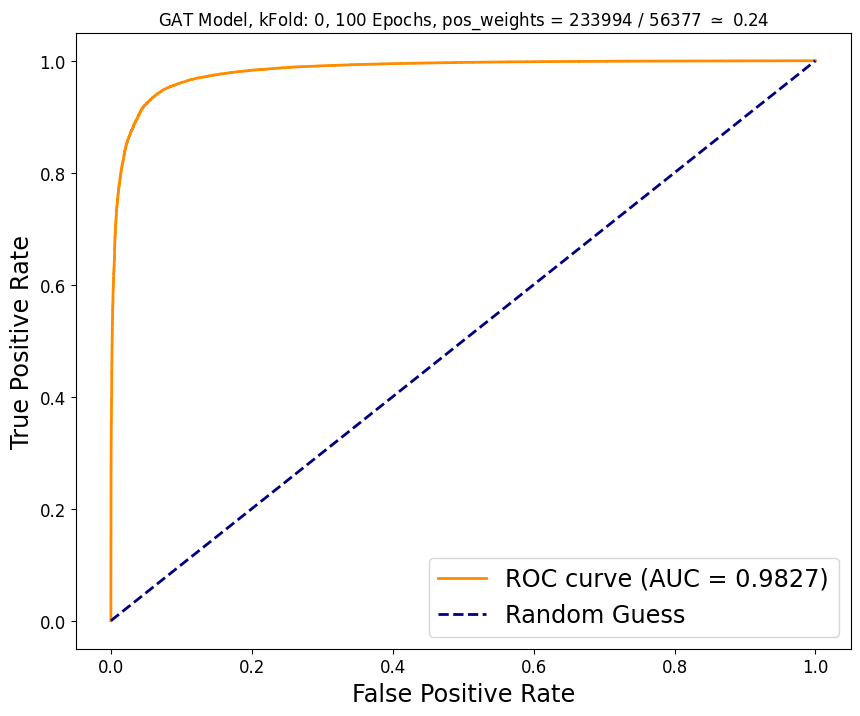

Plotting Score...


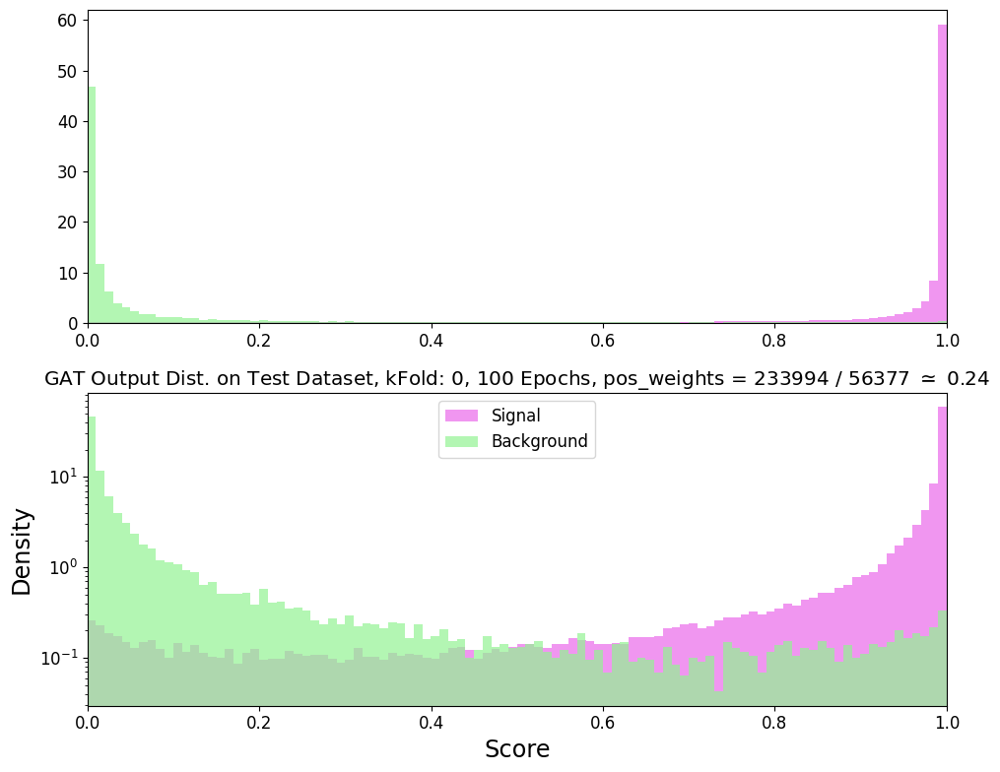

Reading Snapshot for Fold 1...
Done!
Test on Fold 1


Plotting ROC Curve...


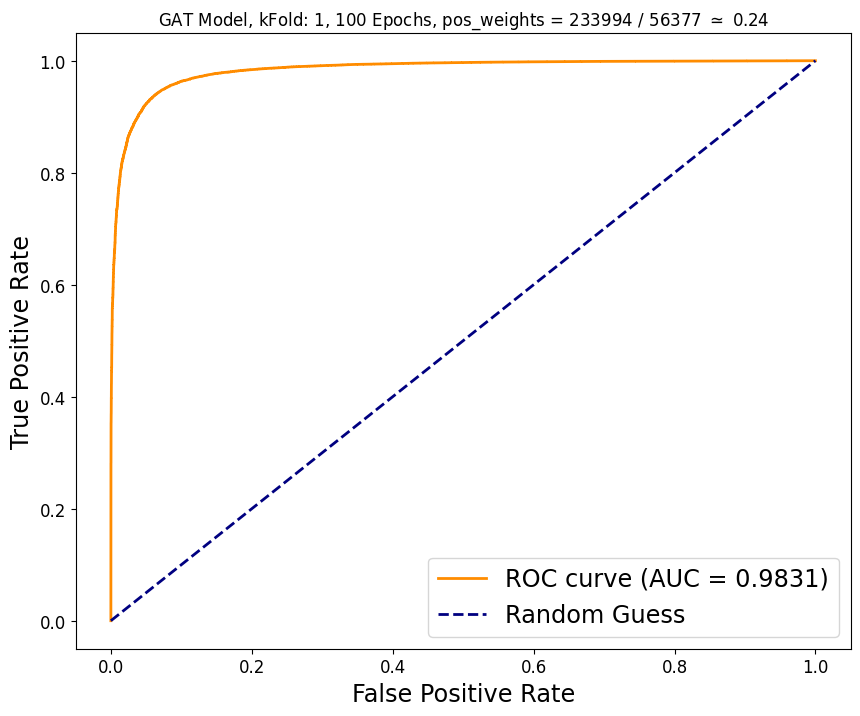

Plotting Score...


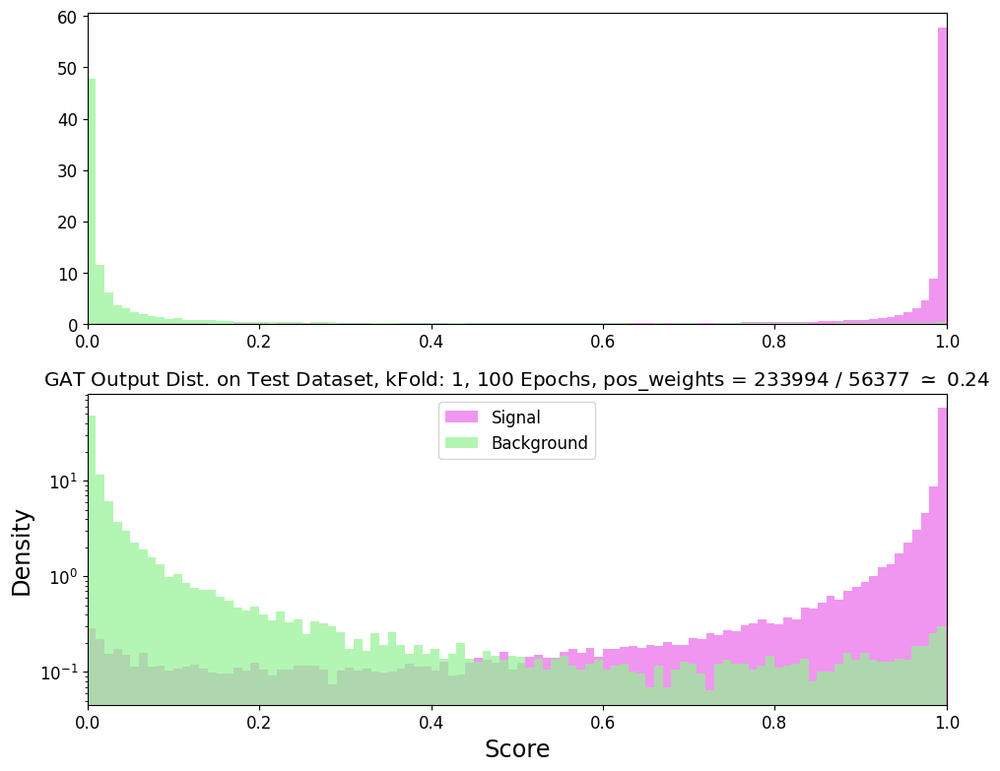

Reading Snapshot for Fold 2...
Done!
Test on Fold 2


Plotting ROC Curve...


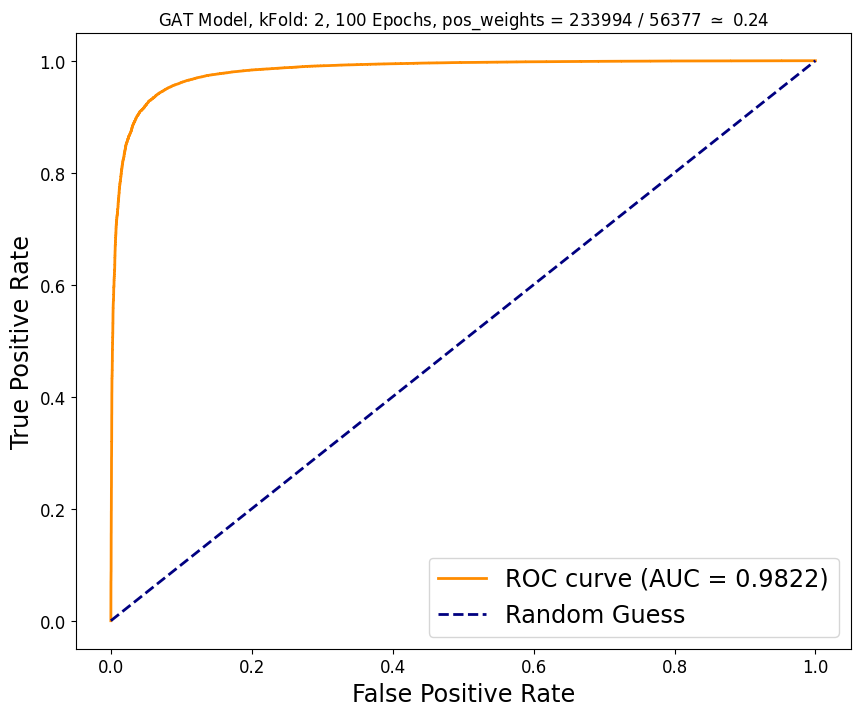

Plotting Score...


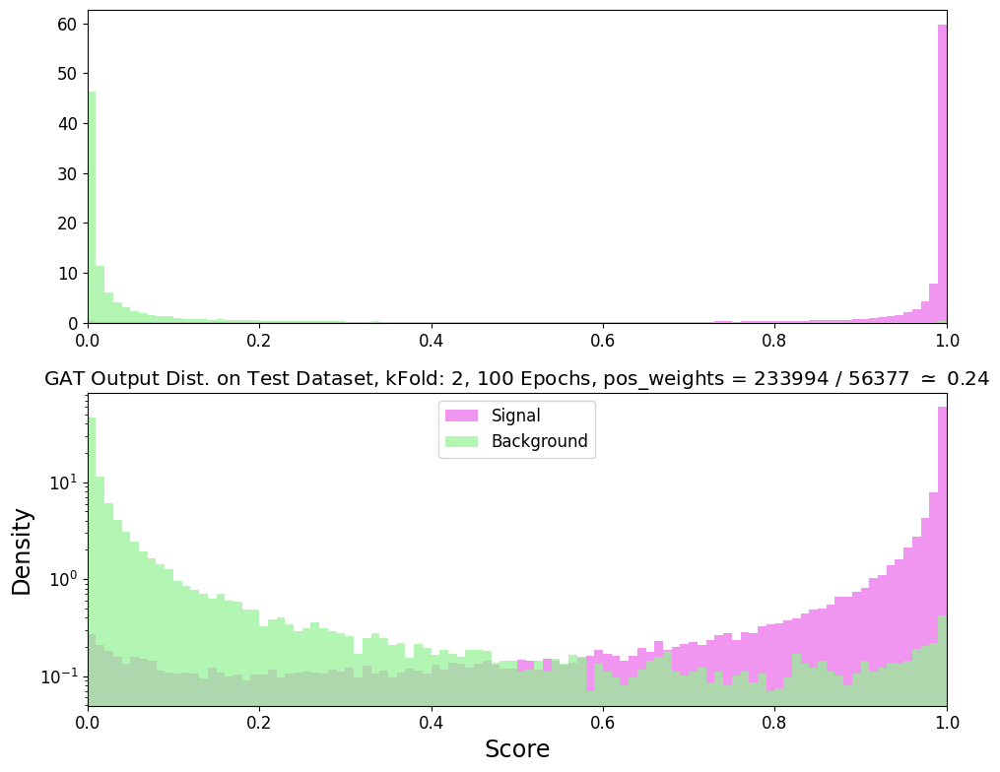

In [11]:
import torch
import torch.nn.functional as F
import time
from torchmetrics import Accuracy
from tqdm import tqdm # for nice bar
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import os

os.makedirs('Saved Figures/GATComplexNorm/kFold', exist_ok=True) 
sig_weight = ttb_no/sig_no
compute_acc = Accuracy(task='binary')
compute_acc.to(device)

test_losses = []
test_accuracies = []
all_true_labels = []
all_predicted_probs = []
all_signal_probs = []
all_background_probs = []



def import_snapshot(model, snap_name):
    checkpoint = torch.load(snap_name)
    
    model.load_state_dict(checkpoint['model_state_dict'])
    val_losses = np.array(checkpoint['val_losses'])
    model.eval()

    return model, val_losses

LAST_EPOCH = 99

all_graphs = setA_graphs, setB_graphs, setC_graphs

for fold in range(len(all_graphs)):
    model.to(device)
    test_graphs = all_graphs[2] # selects the last value of all splits
    test_loader = DataLoader(test_graphs, batch_size=500, shuffle=False)
    print(f'Reading Snapshot for Fold {fold}...')
    model, _ = import_snapshot(model, f"Epochs/fixed_kFolds/Fold_{fold}_epoch_{LAST_EPOCH}.pth")
    print('Done!')
    print(f'Test on Fold {fold}')
    with torch.no_grad():
        out = np.empty(0)
        testy = np.empty(0)
        for batch in tqdm(test_loader, leave=False):
            batch.to(device)
            x =  model(batch.data_norm.float(), batch.edge_index, batch.batch).squeeze()
            out = np.concatenate((out, x.cpu().detach().numpy()))
            testy = np.concatenate((testy, batch.y.float().cpu().detach().numpy()))
        loss = F.binary_cross_entropy_with_logits(torch.tensor(out), torch.tensor(testy), pos_weight=torch.tensor(sig_weight))
        test_losses.append(loss.detach().item())
        test_accuracies.append(compute_acc(torch.tensor(out), torch.tensor(testy)).cpu().detach()) 
    model.cpu()
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'val_losses': val_losses,
        'train_accuracies': train_accuracies,
        'val_accuracies': val_accuracies
    }, f'Epochs/fixed_kFolds/TestSet_Fold_{fold}_epoch_{epoch}.pth')
    # ROC curve plotting
    print('Plotting ROC Curve...')
    model.cpu() # Move model to cpu
    # Concatenate true labels and predicted logits
    true_labels = torch.cat([batch.y for batch in test_loader.dataset]).numpy()
    all_true_labels = np.concatenate((all_true_labels, true_labels))
    predicted_logits = torch.cat([model(batch.data_norm.float(), batch.edge_index, batch.batch).detach().squeeze() for batch in test_loader]).numpy()
    # Convert logits to probabilities using sigmoid function
    predicted_probs = torch.sigmoid(torch.tensor(predicted_logits)).numpy()
    all_predicted_probs = np.concatenate((all_predicted_probs, predicted_probs))
    
    # Compute ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(true_labels, predicted_probs)
    roc_auc = auc(fpr, tpr)

    # Plot ROC curve
    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
    
    plt.xlabel('False Positive Rate',fontsize="x-large")
    plt.ylabel('True Positive Rate',fontsize="x-large")
    plt.title(f'GAT Model, kFold: {fold}, {EPOCH_NUMBER} Epochs, pos_weights = {sig_no} / {ttb_no} $\simeq$ {sig_weight:.2f}')
    plt.legend(loc='lower right',fontsize="x-large")
    plt.savefig(f'Saved Figures/GATComplexNorm/kFold/RoCCurve_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_kFold{fold}.png')
    plt.savefig(f'Saved Figures/GATComplexNorm/kFold/RoCCurve_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_kFold{fold}.pdf')
    plt.show()
    # Score distribution plotting
    # Filter predictions based on true labels (signal and background)
    print('Plotting Score...')
    signal_indices = true_labels == 1
    background_indices = true_labels == 0
    
    signal_probs = predicted_probs[signal_indices]
    all_signal_probs = np.concatenate((all_signal_probs, signal_probs))
    background_probs = predicted_probs[background_indices]
    all_background_probs = np.concatenate((all_background_probs, background_probs))
    
    # Plotting
    plt.figure(figsize=(10, 8))
    plt.subplot(2,1,1)
    plt.yscale('linear')
    plt.hist(signal_probs, bins=100, alpha=0.7, label='Signal', density=True, color='#ea6aea')
    plt.hist(background_probs, bins=100, alpha=0.7, label='Background', density=True, color='#93f393')
    plt.xlim(0,1)
    plt.subplot(2,1,2)
    plt.yscale('log')
    plt.hist(signal_probs, bins=100, color='#ea6aea', alpha=0.7, label='Signal', density=True)
    plt.hist(background_probs, bins=100, color='#93f393', alpha=0.7, label='Background', density=True)
    
    plt.title(f'GAT Output Dist. on Test Dataset, kFold: {fold}, {EPOCH_NUMBER} Epochs, pos_weights = {sig_no} / {ttb_no} $\simeq$ {sig_weight:.2f}',fontsize="large")
    plt.xlabel('Score',fontsize="x-large")
    plt.ylabel('Density',fontsize="x-large")
    plt.xlim(0,1)
    plt.legend()
    plt.tight_layout()
    #plt.savefig('ModelOutputDistDefault.png')
    plt.savefig(f'Saved Figures/GATComplexNorm/kFold/ModelOutputDist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_kFold{fold}.png')
    plt.savefig(f'Saved Figures/GATComplexNorm/kFold/ModelOutputDist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_kFold{fold}.pdf')
    plt.show()   
    all_graphs = set_shift(all_graphs) #shifts the slices by one

Plotting Combined kFold ROC Curve...


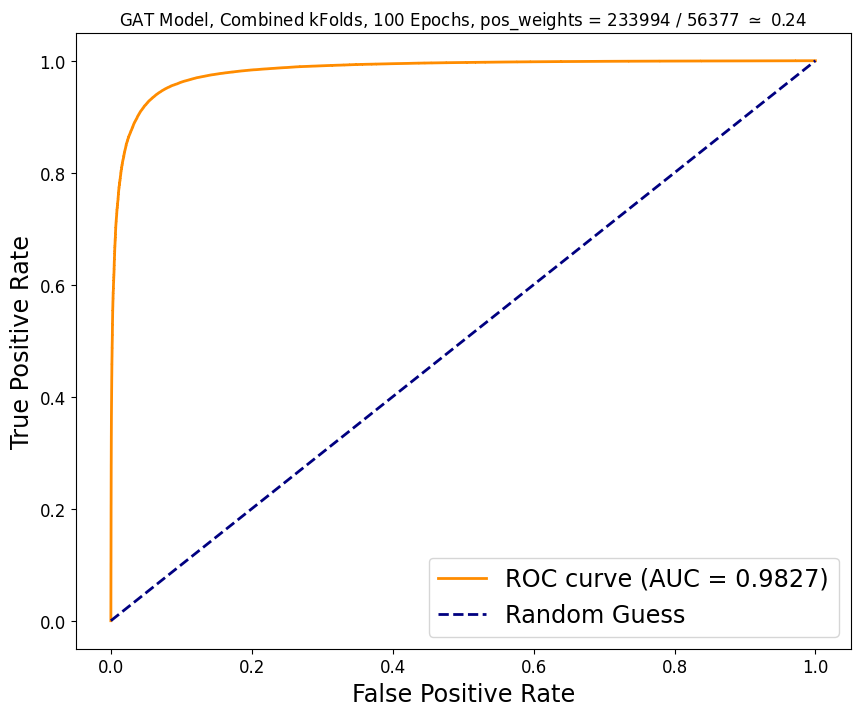

Plotting Combined kFold Score...


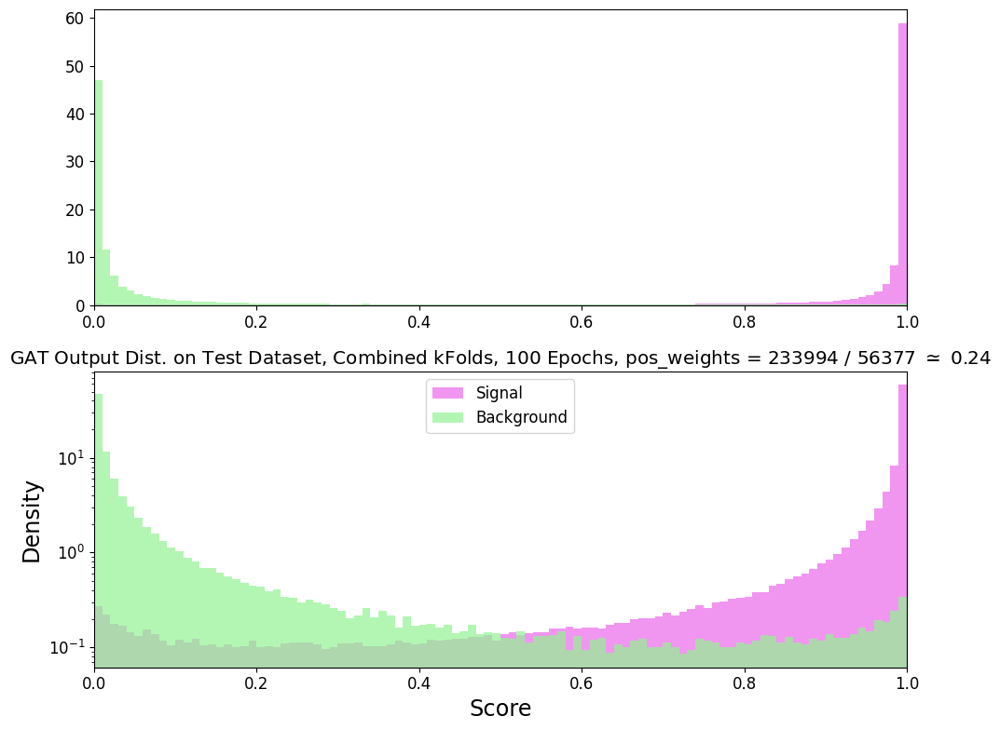

In [12]:
# Combined kfolds
print("Plotting Combined kFold ROC Curve...")
# ROC Curve Plotting
# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(all_true_labels, all_predicted_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')

plt.xlabel('False Positive Rate',fontsize="x-large")
plt.ylabel('True Positive Rate',fontsize="x-large")
plt.title(f'GAT Model, Combined kFolds, {EPOCH_NUMBER} Epochs, pos_weights = {sig_no} / {ttb_no} $\simeq$ {sig_weight:.2f}')
plt.legend(loc='lower right',fontsize="x-large")
plt.savefig(f'Saved Figures/GATComplexNorm/kFold/RoCCurve_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_kFold_TOTAL.png')
plt.savefig(f'Saved Figures/GATComplexNorm/kFold/RoCCurve_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_kFold_TOTAL.pdf')
plt.show()

# Score Plotting
print("Plotting Combined kFold Score...")

# Plotting
plt.figure(figsize=(10, 8))
plt.subplot(2,1,1)
plt.yscale('linear')
plt.hist(all_signal_probs, bins=100, alpha=0.7, label='Signal', density=True, color='#ea6aea')
plt.hist(all_background_probs, bins=100, alpha=0.7, label='Background', density=True, color='#93f393')
plt.xlim(0,1)
plt.subplot(2,1,2)
plt.yscale('log')
plt.hist(all_signal_probs, bins=100, color='#ea6aea', alpha=0.7, label='Signal', density=True)
plt.hist(all_background_probs, bins=100, color='#93f393', alpha=0.7, label='Background', density=True)

plt.title(f'GAT Output Dist. on Test Dataset, Combined kFolds, {EPOCH_NUMBER} Epochs, pos_weights = {sig_no} / {ttb_no} $\simeq$ {sig_weight:.2f}',fontsize="large")
plt.xlabel('Score',fontsize="x-large")
plt.ylabel('Density',fontsize="x-large")
plt.xlim(0,1)
plt.legend()
plt.tight_layout()
#plt.savefig('ModelOutputDistDefault.png')
plt.savefig(f'Saved Figures/GATComplexNorm/kFold/ModelOutputDist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_kFold_TOTAL.png')
plt.savefig(f'Saved Figures/GATComplexNorm/kFold/ModelOutputDist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_kFold_TOTAL.pdf')
plt.show()   

In [13]:
import json

class Weighter:

    def __init__(self, file_name):
        with open(file_name) as f:
            self.procDict = json.load(f)

    def scale(self, proc_name, lumi = 30, sample_frac = 1):
        # Lumi in ab-1

        lumi_ipb = lumi * 1e6     
        #eff_data = (self.events_data/self.procDict[proc_name]["numberOfEvents"])*0.03

        print('cross section:',self.procDict[proc_name]["crossSection"])
        print('kfactor:',self.procDict[proc_name]["kfactor"])
        print('matchingEfficiency:',self.procDict[proc_name]["matchingEfficiency"])
        print('numberOfEvents:',self.procDict[proc_name]["numberOfEvents"])
        return ((lumi_ipb * self.procDict[proc_name]["crossSection"] * 
                self.procDict[proc_name]["kfactor"] * 
                self.procDict[proc_name]["matchingEfficiency"]) / 
                (self.procDict[proc_name]["numberOfEvents"] * sample_frac))

In [14]:
# Cross sections seem to be in pb
#fname = "/cvmfs/fcc.cern.ch/FCCDicts/FCChh_procDict_fcc_v04.json"
fname = "/hepstore/msullivan/FCC/FCCDicts/FCC_procDict_fcc_v04.json"
weighter = Weighter(fname)


scale_signal = weighter.scale("pwp8_pp_hh_lambda100_5f_hhbbtata")
print("HH -> bbtautau scale:", scale_signal)
sig_scale =  [scale_signal] * len(all_signal_probs)
print('')
scale_background = weighter.scale("mgp8_pp_tt012j_5f")
print("ttbar scale:", scale_background)
# ttb_scale = ttb_no*scale/0.2
# print("Scaled ttbar:", ttb_scale)
ttb_scale = [scale_background] * len(all_background_probs)

cross section: 0.082464039
kfactor: 1.075363
matchingEfficiency: 1.0
numberOfEvents: 4997958
HH -> bbtautau scale: 0.5322900454815166

cross section: 43110.0
kfactor: 1.74
matchingEfficiency: 0.467
numberOfEvents: 79123327
ttbar scale: 13281.920185181292


In [15]:
import pandas as pd
import os 

bin_str = '>0.9', '>0.99', '>0.995', '>0.996', '>0.997', '>0.998', '>0.999'

# > 0.9
#bins=np.histogram(np.hstack((all_signal_probs ,all_background_probs)), bins=10)[1] #get the bin edges
bins = np.linspace(0,1,11)
sig_col_1 = [plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea')[0][9]]
bkg_col_1 = [plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393')[0][9]]
#bin_col_1 = [np.round(np.linspace(0.1,0.9,9), decimals=1)]

# > 0.99
#bins=np.histogram(np.hstack((all_signal_probs ,all_background_probs)), bins=100)[1] #get the bin edges
bins = np.linspace(0,1,101)
sig_col_01 = [plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea')[0][99]]
bkg_col_01 = [plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393')[0][99]]
#bin_col_01 = [np.round(np.linspace(0.91,0.99,9), decimals=2)]

# > 0.995 to > 0.999
#bins=np.histogram(np.hstack((all_signal_probs ,all_background_probs)), bins=1000)[1] #get the bin edges
bins = np.linspace(0,1,1001)
sig_col_001 = plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea')[0][995:]
bkg_col_001 = plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393')[0][995:]

# 0.0001 to 1.0000
bins = np.linspace(0,1,10001)
sig_col_full = plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea')[0]
bkg_col_full = plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393')[0]

#revising the array...
sig_col_001 = sig_col_001[::-1]
bkg_col_001 = bkg_col_001[::-1]

sum_sig_col_001 = []
sum_bkg_col_001 = []
for val in range(len(sig_col_001)): #summating values
    sum_sig_col_001.append(sum(sig_col_001[0:val+1]))
    sum_bkg_col_001.append(sum(bkg_col_001[0:val+1]))

# unreversing
sum_sig_col_001 = [sum_sig_col_001[::-1]]
sum_bkg_col_001 = [sum_bkg_col_001[::-1]]

#bin_col_001 = [np.round(np.linspace(0.995,0.998,4), decimals=3)]

# Collecting columns

#bin_col = np.append(np.append(bin_col_1, bin_col_01), bin_col_001)
bin_col = bin_str
sig_col = np.append(np.append(sig_col_1, sig_col_01), sum_sig_col_001)
bkg_col = np.append(np.append(bkg_col_1, bkg_col_01), sum_bkg_col_001)

d = {'bin': bin_col, 'signal': sig_col, 'ttbar': bkg_col}
df = pd.DataFrame(data=d)
print('Unscaled Values:')
print(df) 

os.makedirs('CSVs/kFolds', exist_ok=True)  

df.to_csv(f'CSVs/OutputHist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs.csv', index=False) 
plt.close()

# scaled values

# > 0.9
#bins=np.histogram(np.hstack((all_signal_probs ,all_background_probs)), bins=10)[1] #get the bin edges
bins = np.linspace(0,1,11)
sig_col_1 = [plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea', weights=sig_scale)[0][9]]
bkg_col_1 = [plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393', weights=ttb_scale)[0][9]]
#bin_col_1 = [np.round(np.linspace(0.1,0.9,9), decimals=1)]

# > 0.99
#bins=np.histogram(np.hstack((all_signal_probs ,all_background_probs)), bins=100)[1] #get the bin edges
bins = np.linspace(0,1,101)
sig_col_01 = [plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea', weights=sig_scale)[0][99]]
bkg_col_01 = [plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393', weights=ttb_scale)[0][99]]
#bin_col_01 = [np.round(np.linspace(0.91,0.99,9), decimals=2)]

# > 0.995 to > 0.999
#bins=np.histogram(np.hstack((all_signal_probs ,all_background_probs)), bins=1000)[1] #get the bin edges
bins = np.linspace(0,1,1001)
sig_col_001 = plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea', weights=sig_scale)[0][995:]
bkg_col_001 = plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393', weights=ttb_scale)[0][995:]

# 0.0001 to 1.0000
bins = np.linspace(0,1,10001)
sig_col_full_scaled = plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea', weights=sig_scale)[0]
bkg_col_full_scaled = plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393', weights=ttb_scale)[0]

#revising the array...
sig_col_001 = sig_col_001[::-1]
bkg_col_001 = bkg_col_001[::-1]

sum_sig_col_001 = []
sum_bkg_col_001 = []
for val in range(len(sig_col_001)): #summating values
    sum_sig_col_001.append(sum(sig_col_001[0:val+1]))
    sum_bkg_col_001.append(sum(bkg_col_001[0:val+1]))

# unreversing
sum_sig_col_001 = [sum_sig_col_001[::-1]]
sum_bkg_col_001 = [sum_bkg_col_001[::-1]]

#bin_col_001 = [np.round(np.linspace(0.995,0.998,4), decimals=3)]

# Collecting columns

#bin_col = np.append(np.append(bin_col_1, bin_col_01), bin_col_001)
bin_col = bin_str
sig_col = np.append(np.append(sig_col_1, sig_col_01), sum_sig_col_001)
bkg_col = np.append(np.append(bkg_col_1, bkg_col_01), sum_bkg_col_001)

print('')
print('Scaled Values:')
d = {'bin': bin_col, 'signal': sig_col, 'ttbar': bkg_col}
df = pd.DataFrame(data=d)
print(df) 
plt.close()
df.to_csv(f'CSVs/kFolds/Scaled_combined_OutputHist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs.csv', index=False)

bin_col_full = np.round(np.linspace(0,0.9999,10000), 4)
d = {'bin': bin_col_full, 'signal': sig_col_full, 'signal (scaled)': sig_col_full_scaled, 'ttbar': bkg_col_full, 'ttbar (scaled)': bkg_col_full_scaled}
df_full = pd.DataFrame(data=d)
df_full.to_csv(f'CSVs/kFolds/FULL_combined_OutputHist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs.csv', index=False)

Unscaled Values:
      bin    signal   ttbar
0    >0.9  193564.0  1010.0
1   >0.99  137627.0   191.0
2  >0.995  116281.0   109.0
3  >0.996  109027.0    86.0
4  >0.997   99557.0    67.0
5  >0.998   85839.0    43.0
6  >0.999   63499.0    26.0

Scaled Values:
      bin         signal         ttbar
0    >0.9  103032.190364  1.341474e+07
1   >0.99   73257.482089  2.536847e+06
2  >0.995   61895.218779  1.447729e+06
3  >0.996   58033.986789  1.142245e+06
4  >0.997   52993.200058  8.898887e+05
5  >0.998   45691.245214  5.711226e+05
6  >0.999   33799.885598  3.453299e+05


233994 56377


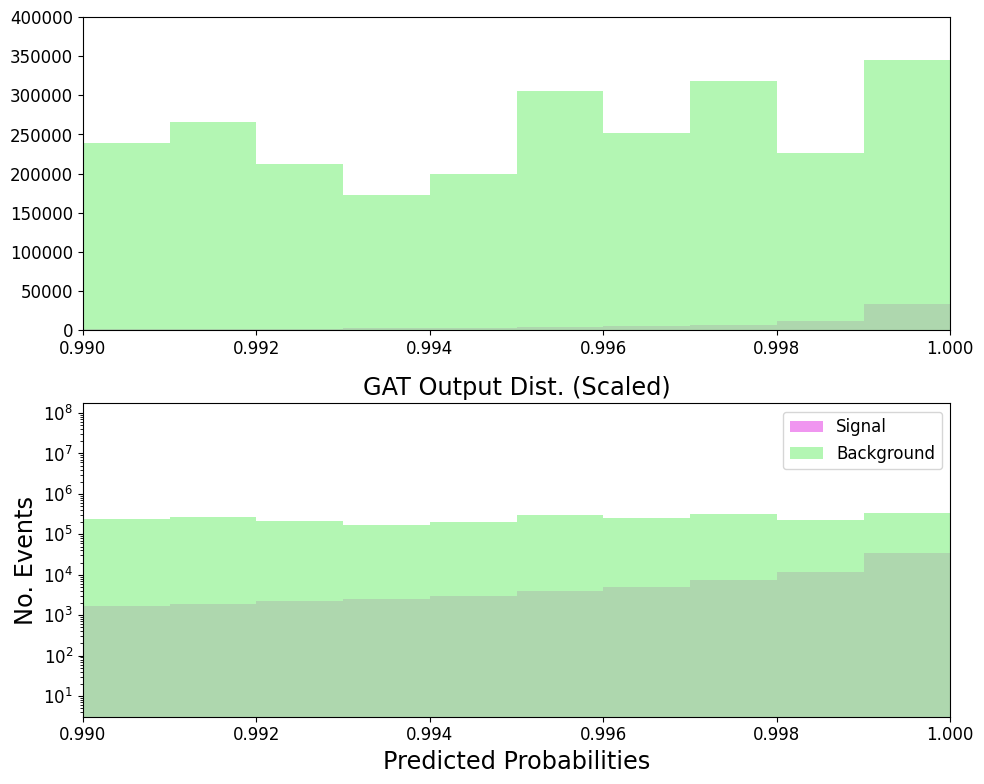

Signal bins (0.99-1.00) =  [ 1534.59220112  1657.01891158  1868.87034968  2217.52032947
  2569.36404954  3049.48967056  3861.23198992  5040.78673071
  7301.95484391 11891.35961605 33799.88559805]

Background bins (0.99-1.00) =  [265638.40370417 239074.56333375 265638.40370417 212510.72296333
 172664.96240771 199228.80277812 305484.16425979 252356.48351896
 318766.084445   225792.64314854 345329.92481542]


In [22]:
# Plotting

print(len(all_signal_probs), len(all_background_probs))

plt.figure(figsize=(10, 8))
plt.subplot(2,1,1)
plt.yscale('linear')
#bins=np.histogram(np.hstack((all_signal_probs ,all_background_probs)), bins=1000)[1] #get the bin edges
bins = np.linspace(0,1,1001)
plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea', weights=sig_scale)
plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393', weights=ttb_scale)
plt.ylim(0,400000)
plt.xlim(0.99,1)
plt.subplot(2,1,2)
plt.yscale('log')
#bins=np.histogram(np.hstack((all_signal_probs ,all_background_probs)), bins=1000)[1] #get the bin edges
bins = np.linspace(0,1,1001)
plt.hist(all_signal_probs, bins=bins, color='#ea6aea', alpha=0.7, label='Signal', weights=sig_scale)
plt.hist(all_background_probs, bins=bins, color='#93f393', alpha=0.7, label='Background', weights=ttb_scale)

plt.title(f'GAT Output Dist. (Scaled)',fontsize="x-large")
plt.xlabel('Predicted Probabilities',fontsize="x-large")
plt.ylabel('No. Events',fontsize="x-large")
plt.xlim(0.99,1)
plt.legend(loc='upper right')
plt.tight_layout()
#plt.savefig('ModelOutputDistDefault.png')
plt.savefig(f'Saved Figures/GATComplexNorm/kFold/ModelOutputDist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_scaled_zoom_1000bin.png')
plt.savefig(f'Saved Figures/GATComplexNorm/kFold/ModelOutputDist_GAT_{save_bool}norm_{stats_string}_{EPOCH_NUMBER}epochs_scaled_zoom_1000bin.pdf')
plt.show()

print('Signal bins (0.99-1.00) = ',plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea', weights=sig_scale)[0][989:])
print('')
print('Background bins (0.99-1.00) = ',plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Background', color='#93f393', weights=ttb_scale)[0][989:])
plt.close()

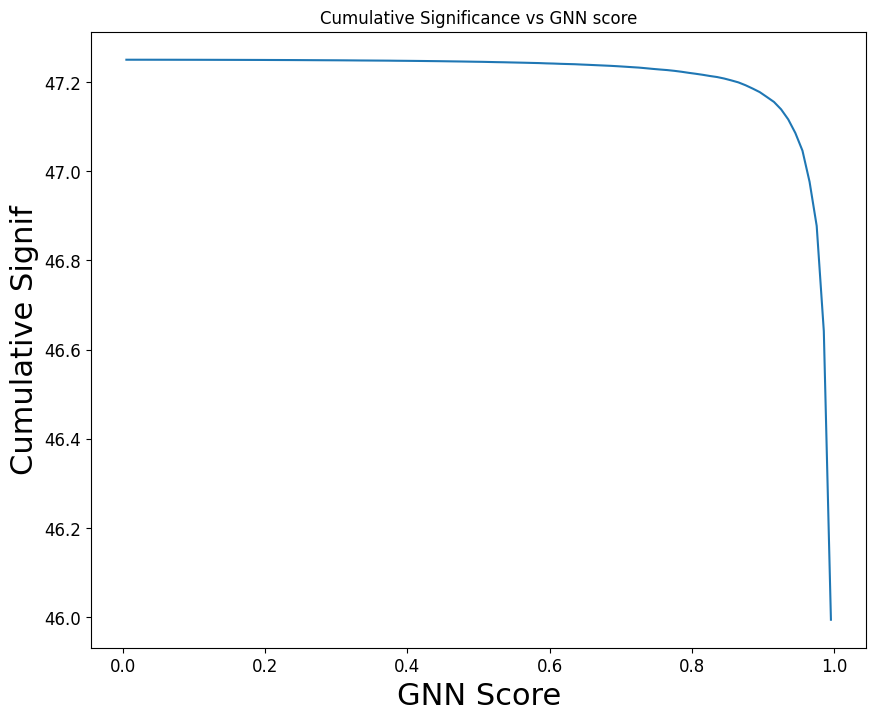

In [17]:
# Cumulative Signifiance

bins = np.linspace(0, 1.0, 101)

ns = plt.hist(all_signal_probs, bins=bins, alpha=0.7, label='Signal', color='#ea6aea', weights=sig_scale)[0]
nb = plt.hist(all_background_probs, bins=bins, alpha=0.7, label='Signal', color='#93f393', weights=ttb_scale)[0]

plt.close()
def cumul_signif(nsig, nbkg, bins): # Thank for this function Carl :)
    "Function to calculate cumulative signifiance"
    signif = 0
    signifs = []
    bincents = []

    # Loop over signal and background per bin from the right
    for (nsi, nbi) in zip(reversed(nsig), reversed(nbkg)):
        #print (nsi, nbi)
        # Sum significances in quadrature and store sqrt
        signif += (nsi/np.sqrt(nbi)) ** 2
        signifs.append(np.sqrt(signif))   
    
    # Reverse back to correct direction
    signifs = np.array(list(reversed(signifs)))

    # Find bin centres
    for i in range(len(bins[:-1])):
        #print(i, bins[i+1], bins[i])
        c = bins[i] + (bins[i+1] - bins[i])/2
        bincents.append(c) 
        
    return bincents, signifs

bincents, signifs = cumul_signif(ns, nb, bins) 

plt.figure(figsize=(10, 8))
plt.title("Cumulative Significance vs GNN score")
plt.xlabel("GNN Score")
plt.ylabel("Cumulative Signif")
plt.savefig(f'Saved Figures/Significance/CumPerBinCumulativeSignificance_{save_bool}_{stats_string}_{EPOCH_NUMBER}Epochs.pdf')
plt.savefig(f'Saved Figures/Significance/CumPerBinCumulativeSignificance_{save_bool}_{stats_string}_{EPOCH_NUMBER}Epochs.png')
plt.plot(bincents, signifs)
plt.show()

100
45.99439079372867


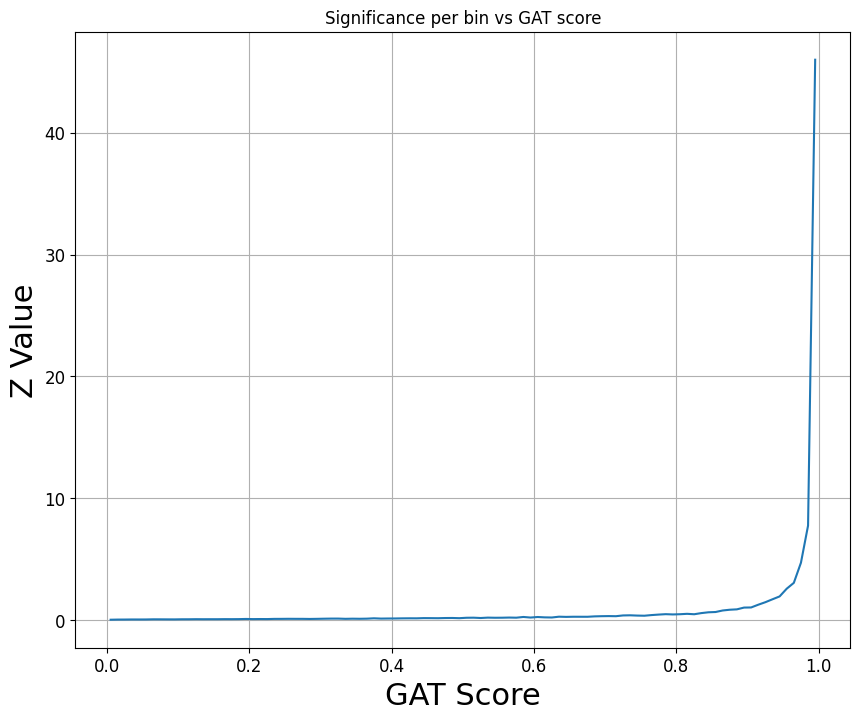

In [18]:
#calculating significance per bin:

data_bybin = list(zip(ns, nb)) #zipping up signal and background counts in each bin

def significance(s,b, syst_err = 0):
    z_val = s/np.sqrt(b + syst_err**2) 
    return z_val

Z_values = []
for i in range(len(data_bybin)): #for each bin
    Z_values.append(significance(data_bybin[i][0],data_bybin[i][1])) #calculating significance and appending to list

print(len(Z_values)) #as there is 50 bins, should be 50 Z values.
print(Z_values[len(Z_values)-1]) #last bin Z value

#Plotting using centre of each bin:
plt.figure(figsize=(10, 8))
plt.title("Significance per bin vs GAT score")
plt.plot(bincents, Z_values)
os.makedirs('Saved Figures/Significance', exist_ok=True)
plt.xlabel('GAT Score')
plt.ylabel('Z Value')
plt.grid()
plt.savefig(f'Saved Figures/Significance/PerBinSignificance_{save_bool}_{stats_string}_{EPOCH_NUMBER}Epochs.pdf')
plt.savefig(f'Saved Figures/Significance/PerBinSignificance_{save_bool}_{stats_string}_{EPOCH_NUMBER}Epochs.png')
plt.show()